# Store Sales - Time Series Forecasting

**Programa de Engenharia de Sistemas e Computação**

**CPS833 - Data Mining**

**Professor**: Geraldo Zimbrão da Silva

**Aluno**: Luiz Henrique Souza Caldas

Faça a previsão de vendas por loja e por produto. Comece mais básico:

1. Primeiro preveja a venda total de uma Loja ou de um produto em uma loja;

2. Acrescente a informação de feriados. Use a venda total para confirmar os feriados (locais e nacionais e transferidos)

3. Acrescente a informação do Barril de petróleo

4. Acrescente o pagamento dos funcionários públicos (de 15 em 15 dias)

5. Ao final, faça a previsão para todas as lojas e produtos

6. Submeta e veja o seu resultado.

## Importações

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.signal import periodogram
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_log_error

## Análise Exploratória dos dados

In [5]:
# Classe para Análise Exploratória dos Dados
class EDA:
    def __init__(self, name, initial=None):
        self.dataset = pd.read_csv(
            name,
            usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
            dtype={
                'store_nbr': 'category',
                'family': 'category',
                'sales': 'float32',
                'onpromotion': 'uint32',
            },
            parse_dates=['date'],
        )
        self.dataset['date'] = self.dataset.date.dt.to_period('D')

        if initial:
            self.dataset=self.dataset[self.dataset['date'] >= initial]

        self.family_sales = (
             self.dataset
             .drop('onpromotion', axis=1)
             .set_index(['store_nbr', 'family', 'date'])
             .sort_index()
             .groupby(['family', 'date'], observed=False)
             .sum()
             .unstack('family')
             .fillna(0)
             )

    def initial_exploitation(self):
        fig, ax = plt.subplots(nrows=3, ncols=1,figsize=(16, 8))
        df = [self.dataset.head(),self.dataset.tail()]
        for i in range(2):
            ax[i].xaxis.set_visible(False)
            ax[i].yaxis.set_visible(False)
            ax[i].set_frame_on(False)
            table = ax[i].table(cellText=df[i].values, colLabels=df[i].columns, cellLoc='center', loc='center')
            table.auto_set_font_size(False)
            table.set_fontsize(12)
            table.scale(1.2, 1.2)
        ax[0].set_title("head")
        ax[1].set_title("tail")
        texto = f"{self.dataset.isnull().any().sum()} dados faltantes no dataset de treino \n"
        texto += f"{self.dataset.duplicated().sum()} linhas duplicadas no dataset de treino \n"
        texto += f"shape {self.dataset.shape} \n"
        cols_categoricas = self.dataset.select_dtypes(include=['category']).nunique()
        texto += f'{cols_categoricas.shape[0]} colunas de dados categóricos \n'
        num_family= cols_categoricas['family']
        texto += f'{num_family} familias diferentes \n'
        ax[2].text(0.5, 0.5, texto, fontsize=12, ha='center', va='center', wrap=True)
        ax[2].xaxis.set_visible(False)
        ax[2].yaxis.set_visible(False)
        ax[2].set_frame_on(False)
        plt.tight_layout()
        plt.show()

    def plot_periodogram(self, y, familia, ax):
        # Periodograma
        f, Pxx = periodogram(
            y.values.reshape(-1),
            fs=pd.Timedelta("365D") / pd.Timedelta("1D"),
            detrend='linear',
            window="boxcar",
            scaling='spectrum',
        )
        # return print(y, f, Pxx), print(type(y), type(f), type(Pxx))
        ax.step(f, Pxx, color="purple")
        ax.set_xscale("log")
        ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
        ax.set_xticklabels(
            [
                "Annual (1)",
                "Semiannual (2)",
                "Quarterly (4)",
                "Bimonthly (6)",
                "Monthly (12)",
                "Biweekly (26)",
                "Weekly (52)",
                "Semiweekly (104)",
            ],
            rotation=30,
        )
        ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
        ax.set_ylabel("Variance")
        ax.set_title(f'Periodograma de {familia}')
        return ax

    def family_analysis(self, familia):
        df = self.family_sales.loc(axis=1)[:, familia]
        df.index = df.index.to_timestamp()
        fig = plt.figure(figsize=(10, 8))
        gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 1])
        # Plot sales e trend
        ax0 = fig.add_subplot(gs[0, :])
        trend365 =  df['sales'].rolling(
                        window=365,
                        center=True,
                        min_periods=183,
                    ).mean()
        trend30 =  df['sales'].rolling(
                        window=30,
                        center=True,
                        min_periods=15,
                    ).mean()
        ax0.plot(df.index, df['sales'], marker='.', linestyle='-', color='0.25', label='vendas', linewidth=1, markersize=4)
        ax0.plot(df.index, trend365, color='blue', label='média móvel (365 dias)')
        ax0.plot(df.index, trend30, color='red', label='média móvel (30 dias)')
        ax0.set_title(f'Vendas e tendências para {familia}')
        ax0.set_xlabel('Date')
        ax0.set_ylabel(familia)
        ax0.legend()
        # Boxplot e Histograma
        ax1 = fig.add_subplot(gs[1, 0])
        df['sales'].plot(kind='box', ax=ax1)
        ax1.set_title(f'Boxplot de {familia}')
        ax1.set_xlabel('')
        ax2 = fig.add_subplot(gs[1, 1])
        sns.histplot(data=df, x=('sales', familia), kde=True, bins=10, ax=ax2)
        ax2.set_title(f'Histograma de {familia}')
        ax2.set_xlabel(familia)
        ax2.set_ylabel('Density')
        # Periodograma
        ax3 = fig.add_subplot(gs[2, :])
        ax3 = self.plot_periodogram(df['sales'],familia,ax3)
        plt.tight_layout()
        plt.show()

    def all_families_analysis(self):
        df = self.family_sales
        familias = df.select_dtypes(include=['number']).columns.tolist()
        for familia in familias:
            self.family_analysis(familia[1])
       
    def calc_deseason(self, familia, freq, order):
        sales = self.family_sales.loc(axis=1)[:, familia]
        y = sales.loc[:, 'sales'].squeeze()
        # vendas e sua sazonalidade
        fourier = CalendarFourier(freq=freq, order=order)
        dp = DeterministicProcess(
            index=y.index,
            constant=True,
            order=1,
            seasonal=True,
            additional_terms=[fourier],
            drop=True,
        )
        X = dp.in_sample()
        model = LinearRegression(fit_intercept=False).fit(X, y)
        y_pred = pd.Series(model.predict(X), index=X.index)
        y_dessaz = pd.Series(y.values - y_pred.values, index=X.index)
        return y, y_pred, y_dessaz

    def family_deseason(self, familia, freq, order):
        y, y_pred, y_dessaz = self.calc_deseason(familia, freq, order)
        _, ax = plt.subplots(nrows=3, figsize=(16, 8))
        ax[0].plot(y.index.to_timestamp(), y.values, marker='.', linestyle='-', color='0.25', label='vendas', linewidth=1, markersize=4)
        ax[0].plot(y.index.to_timestamp(), y_pred, label='sazonalidade')
        ax[0].plot(y.index.to_timestamp(), y_dessaz, label='dessazonalizado')
        ax[0].set_title(f'Vendas e sazonalidade para {familia}')
        ax[0].set_ylabel('vendas')
        ax[0].legend()
        # periodorama sazonal
        ax[1] = self.plot_periodogram(y, familia, ax[1])
        ax[1].set_title(f'Periodograma de {familia} sazonal')
        # periodorama dessazonalizado
        ax[2] = self.plot_periodogram(y_dessaz, familia, ax[2])
        ax[2].set_title(f'Periodograma de {familia} dessazonalizado')
        y_lim = ax[1].get_ylim()
        ax[2].set_ylim(top=y_lim[1])
        plt.tight_layout()
        plt.show()

    def all_families_deseason(self, freq, order):
        df = self.family_sales
        familias = df.select_dtypes(include=['number']).columns.tolist()
        for familia in familias:
            self.family_deseason(familia[1], freq, order)

    def family_lag(self, familia, freq, order, max_lag=8):
        _, _, y_dessaz = self.calc_deseason(familia, freq, order)
        df = y_dessaz.to_frame(name='sales')
        # Gerando as colunas de lag
        for lag in range(1, max_lag + 1):
            df[f'lag_{lag}'] = df['sales'].shift(lag)

        # Definindo o número de colunas e linhas para os subplots
        num_cols = 4
        num_rows = (max_lag + 1) // num_cols + ((max_lag + 1) % num_cols > 0) 
        print(num_rows)
        fig = plt.figure(figsize=(20, 10))
        gs = plt.GridSpec(num_rows, num_cols, wspace=0.2, hspace=0.6)
        # Plotando os gráficos de dispersão
        for lag in range(1, max_lag + 1):
            correlation = df['sales'].corr(df[f'lag_{lag}'])
            row_idx = (lag-1) // num_cols  # Índice da linha para o subplot
            col_idx = (lag-1) % num_cols  # Índice da coluna para o subplot
            ax = fig.add_subplot(gs[row_idx, col_idx]) if num_rows > 1 else fig.add_subplot(gs[col_idx])
            sns.scatterplot(x=f'lag_{lag}', y='sales', data=df, ax=ax)
            sns.regplot(x=f'lag_{lag}', y='sales', data=df, scatter=False, color='red', ci=None, ax=ax)
            ax.set_title(f'Lag {lag} vs {familia:5}')
            ax.set_xlabel(f'Lag {lag}')
            ax.set_ylabel('Vendas')
            ax.grid(True)
            ax.text(0.05, 0.95, f'r: {correlation:.2f}', transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))
        ax_acf = fig.add_subplot(gs[-1, :])
        plot_pacf(df['sales'], lags=max_lag, ax=ax_acf)
        acf_values = pacf(df['sales'], nlags=max_lag)
        delta = 0.05
        ax_acf.set_ylim(top=max(max(acf_values), 0) + delta, bottom=min(min(acf_values), 0) - delta)
        ax_acf.set_xlabel('Lag')
        ax_acf.set_ylabel('Autocorrelation')
        ax_acf.grid(True)
        plt.show()

    def all_families_lag(self, freq, order, max_lag=8):
        df = self.family_sales
        familias = df.select_dtypes(include=['number']).columns.tolist()
        for familia in familias:
            self.family_lag(familia[1], freq, order, max_lag)

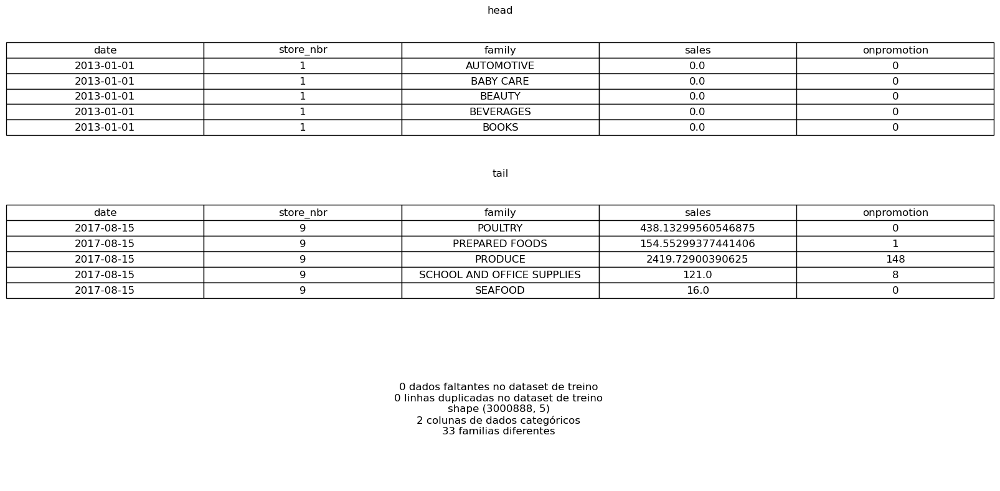

In [6]:
eda = EDA('train.csv')
eda.initial_exploitation()

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


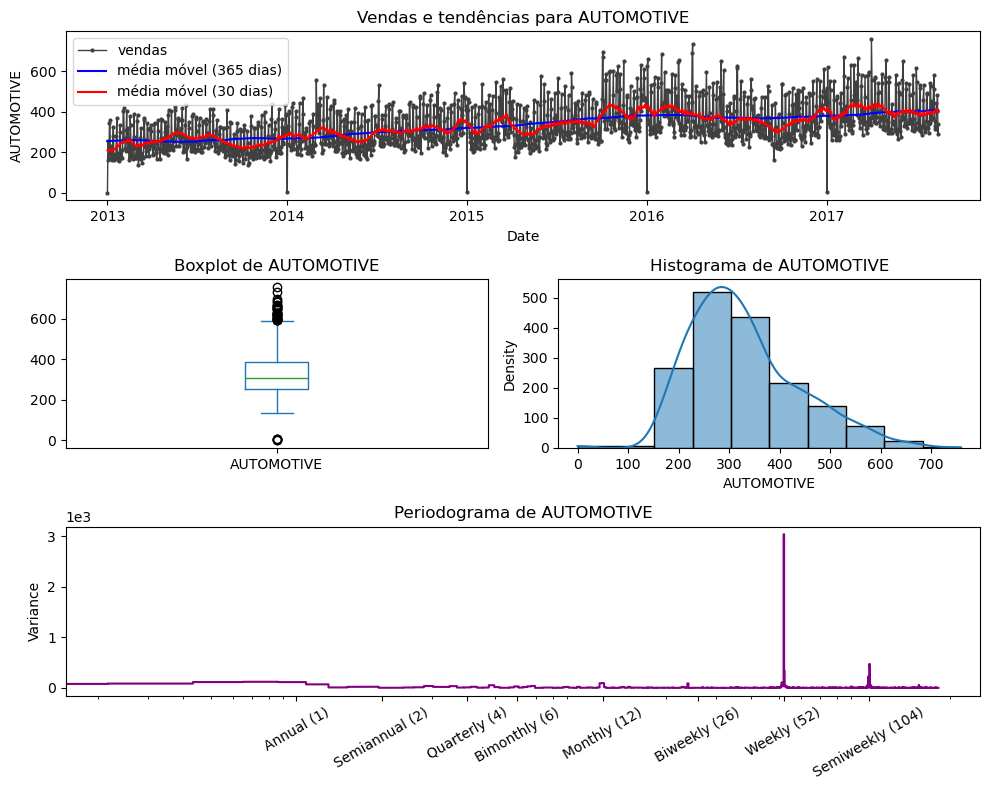

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


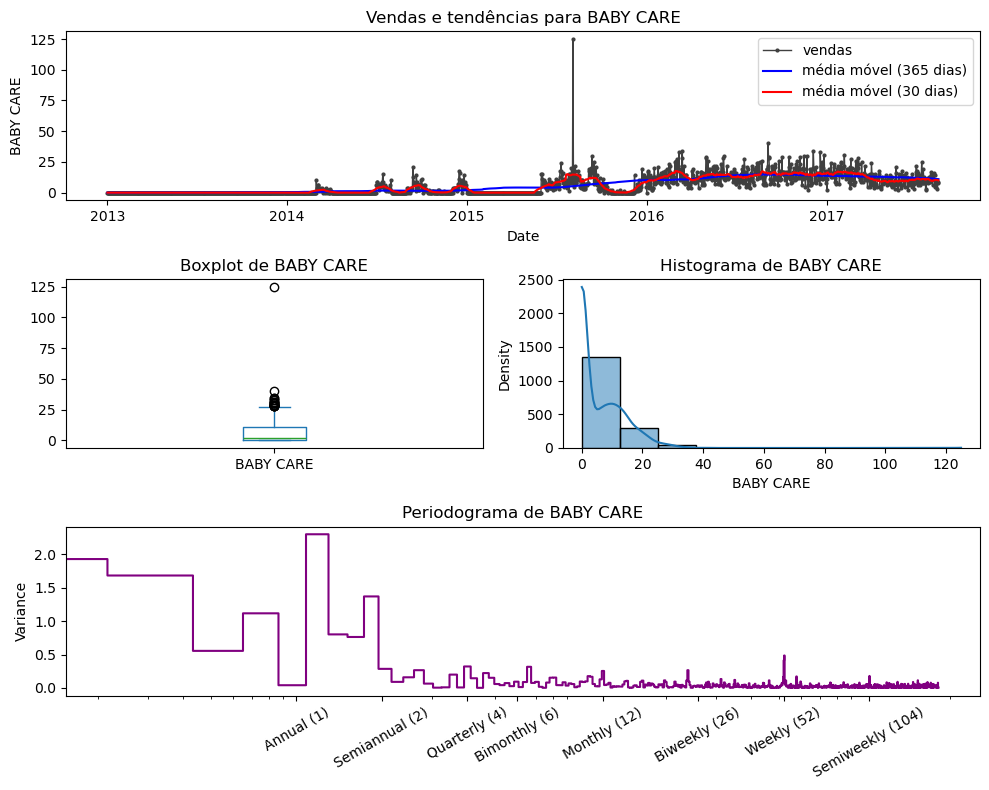

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


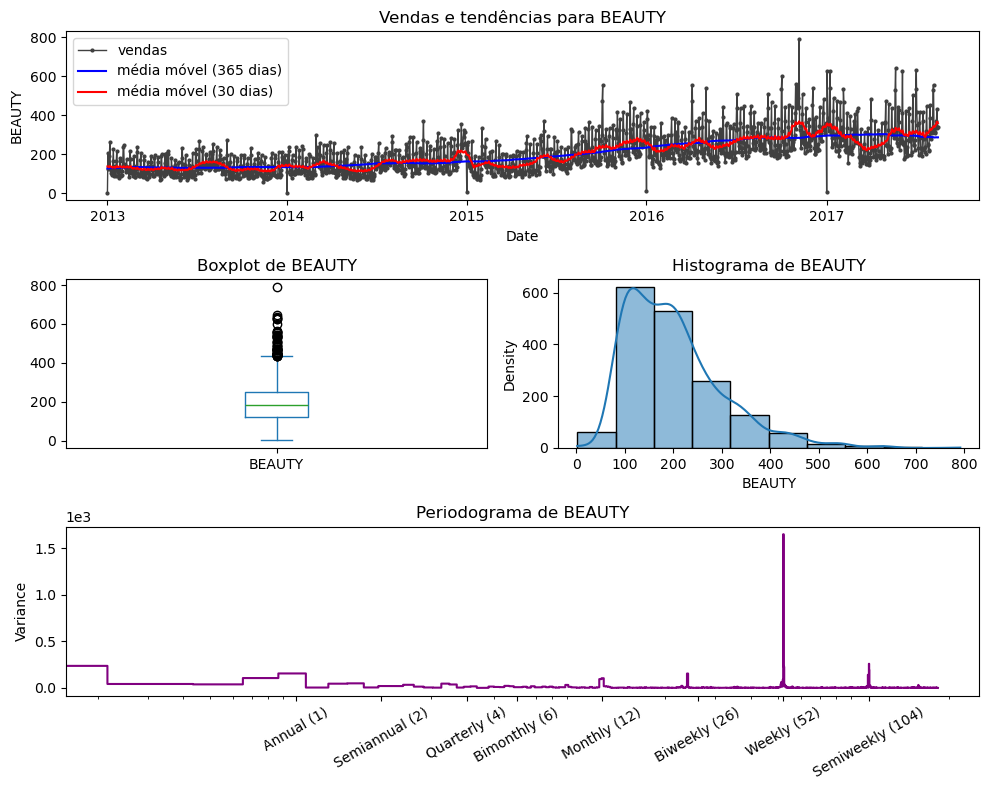

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


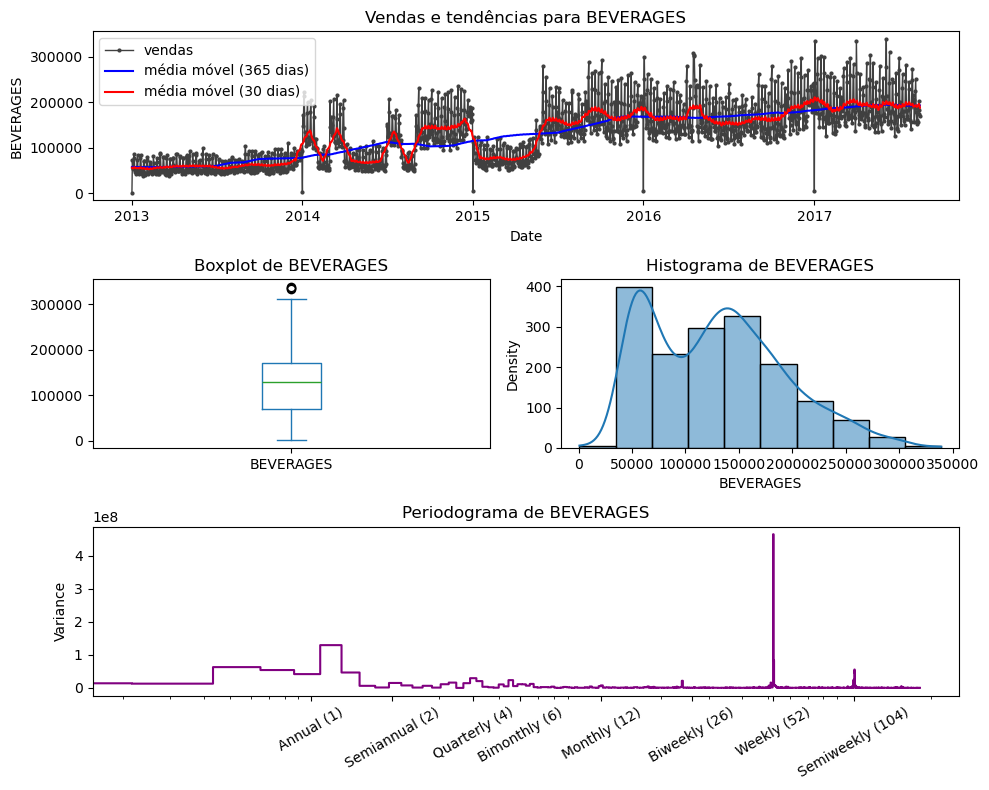

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


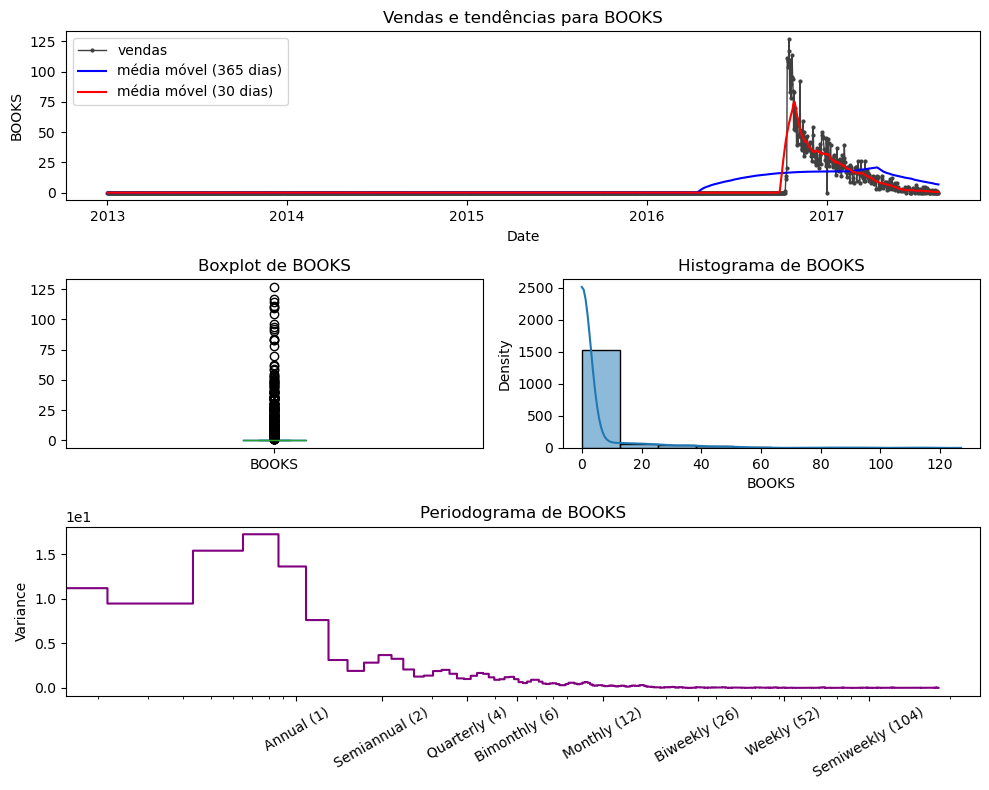

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


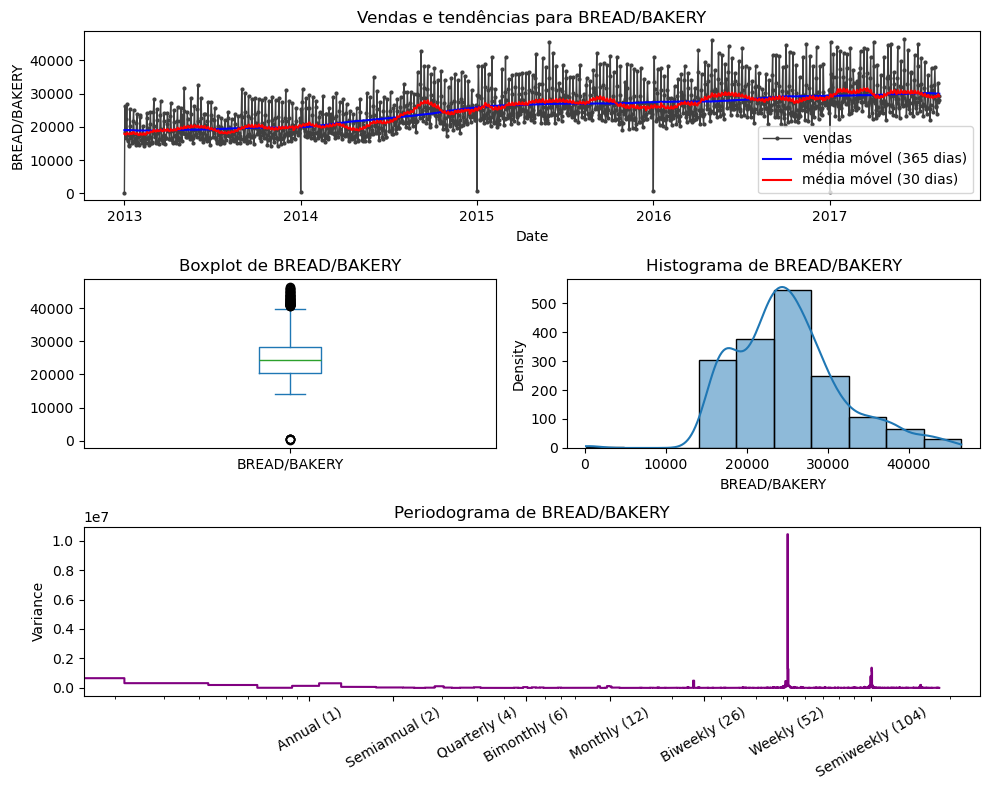

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


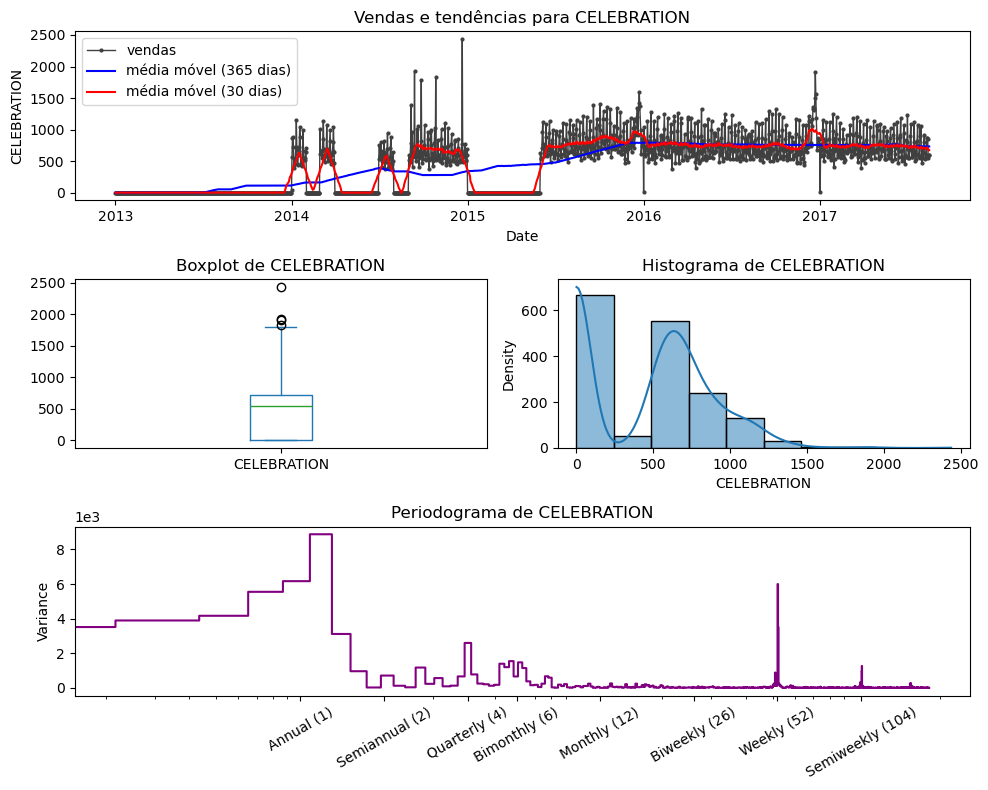

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


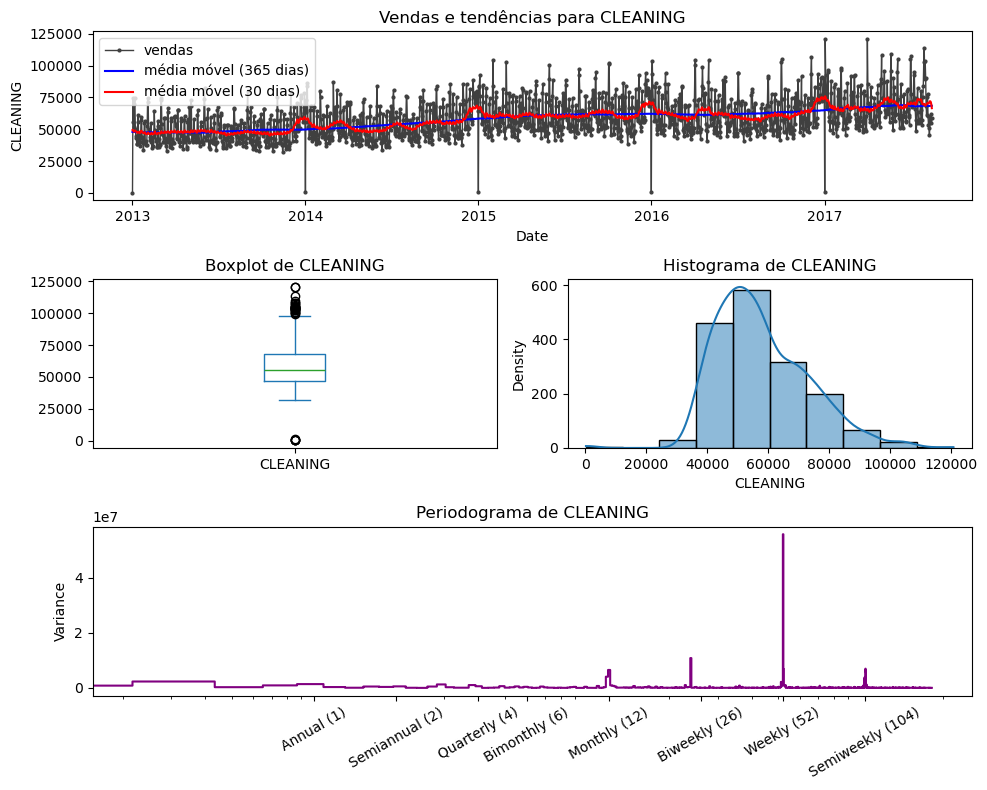

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


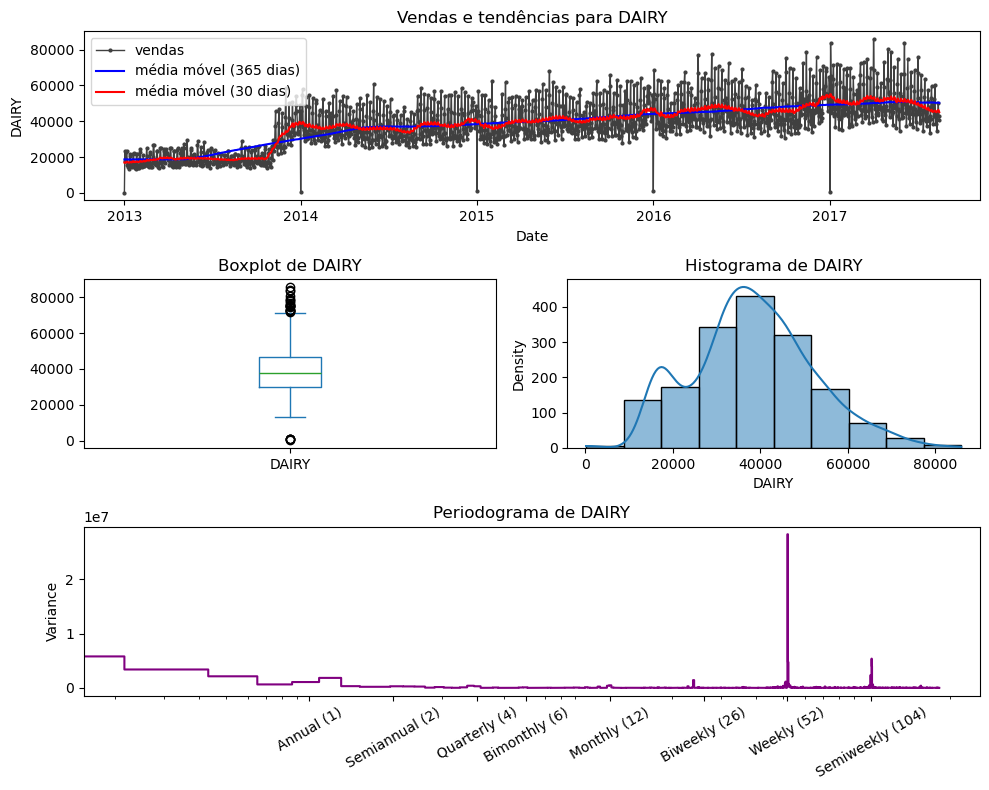

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


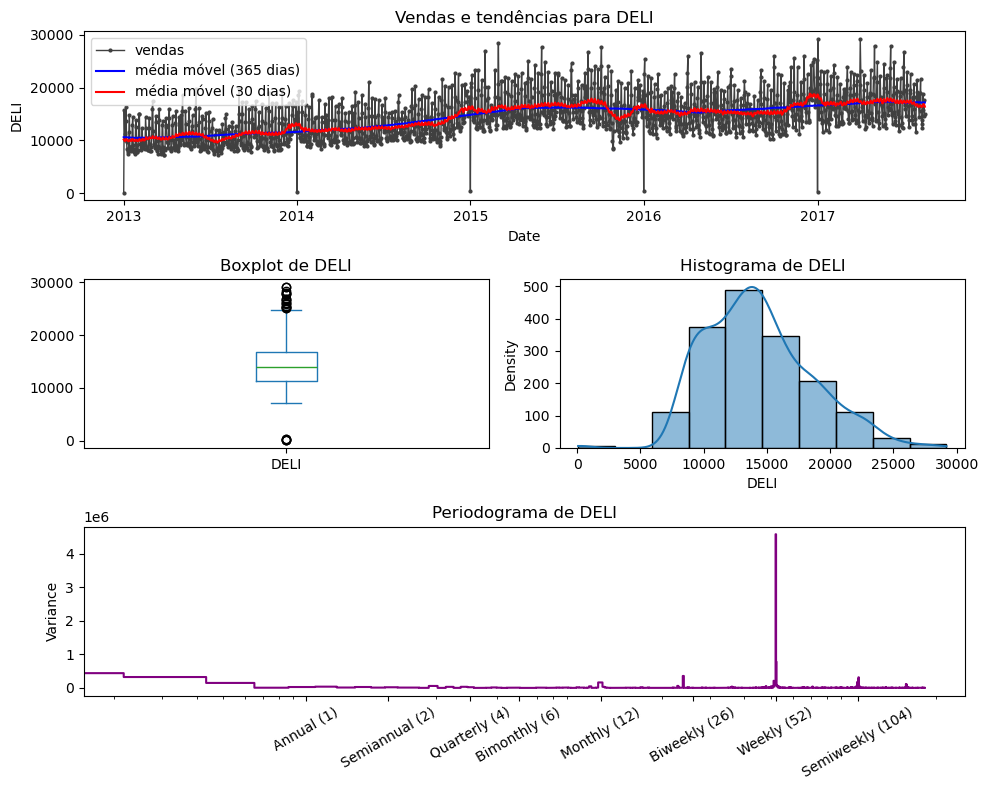

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


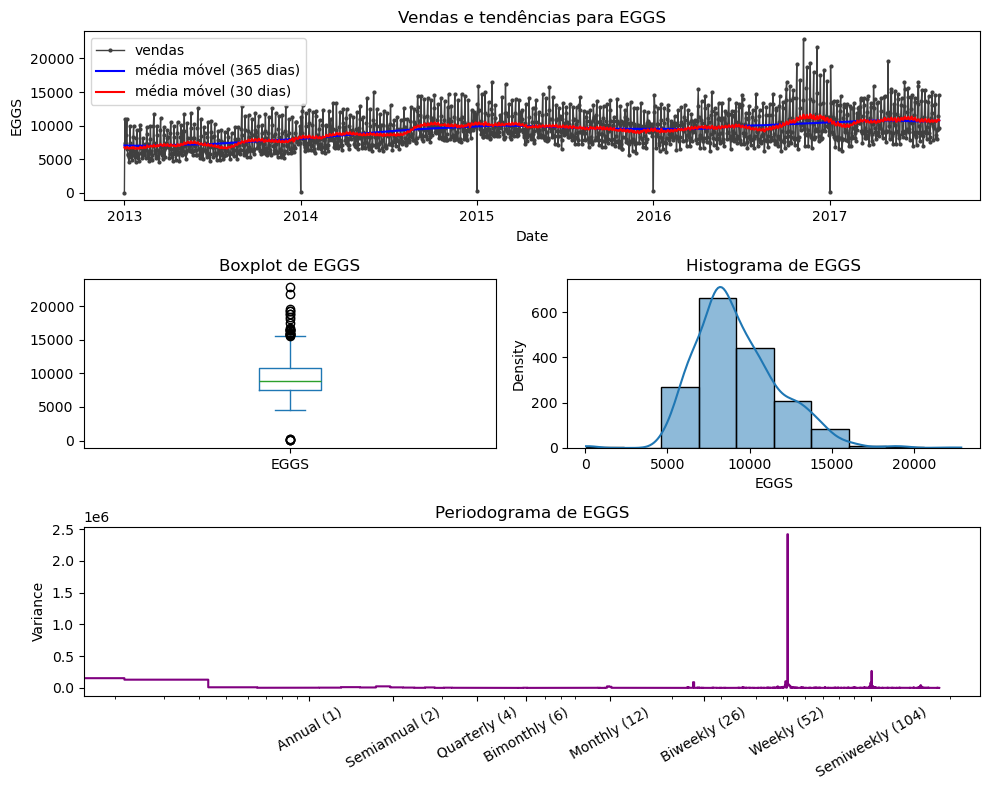

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


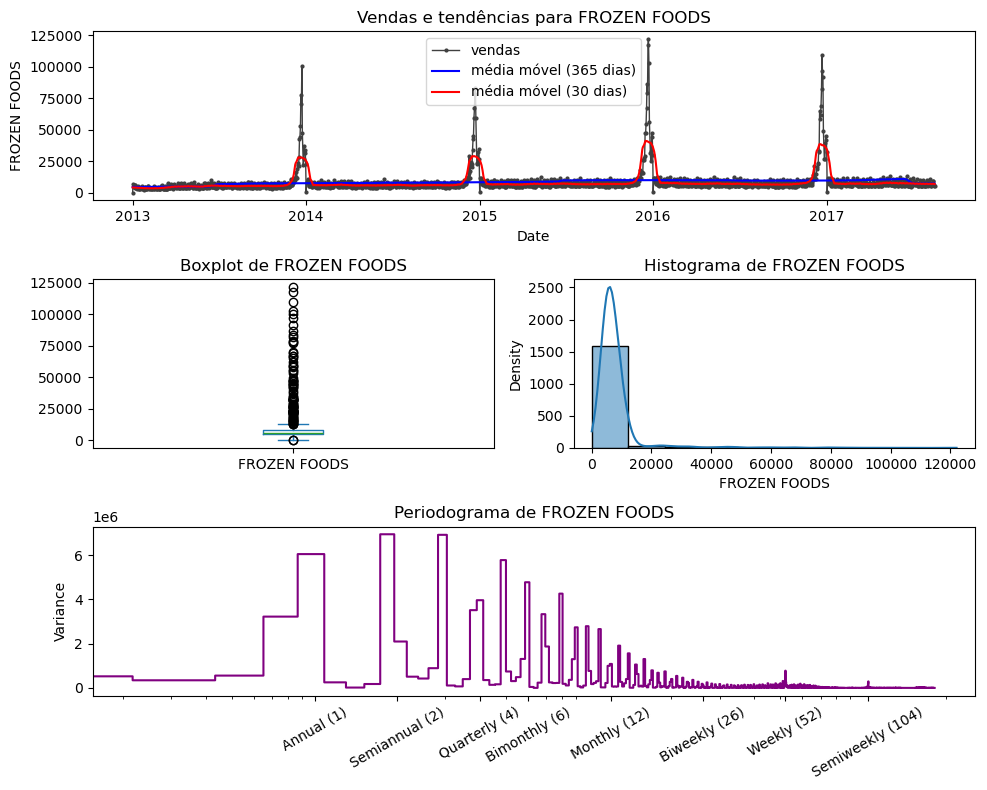

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


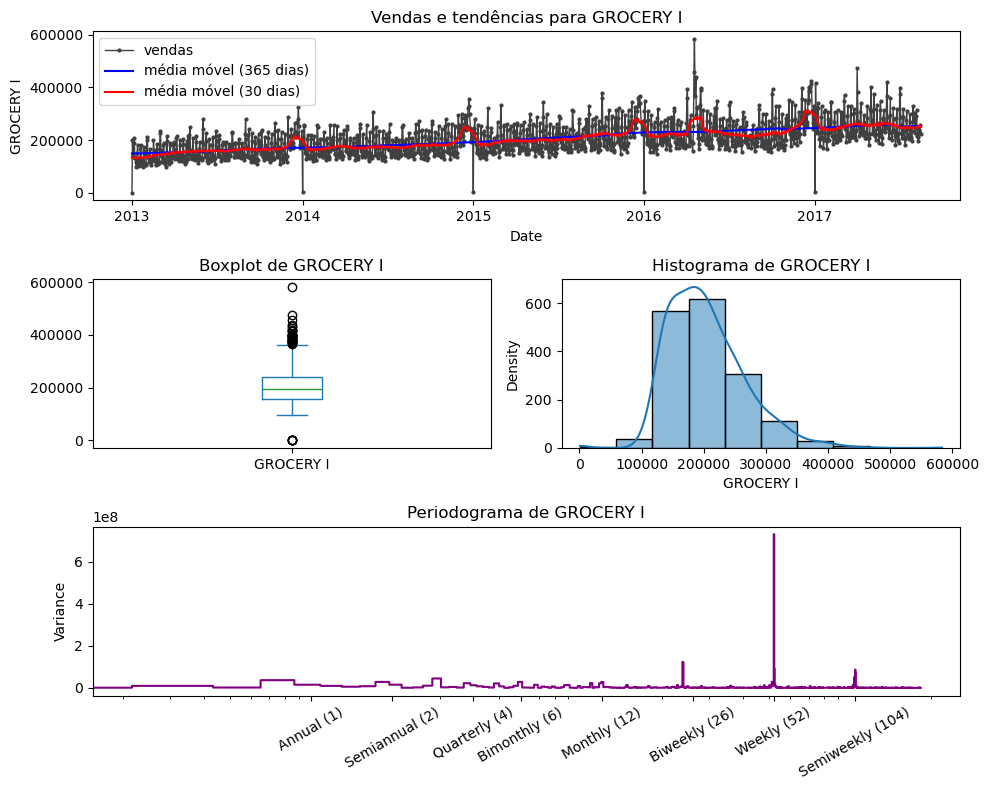

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


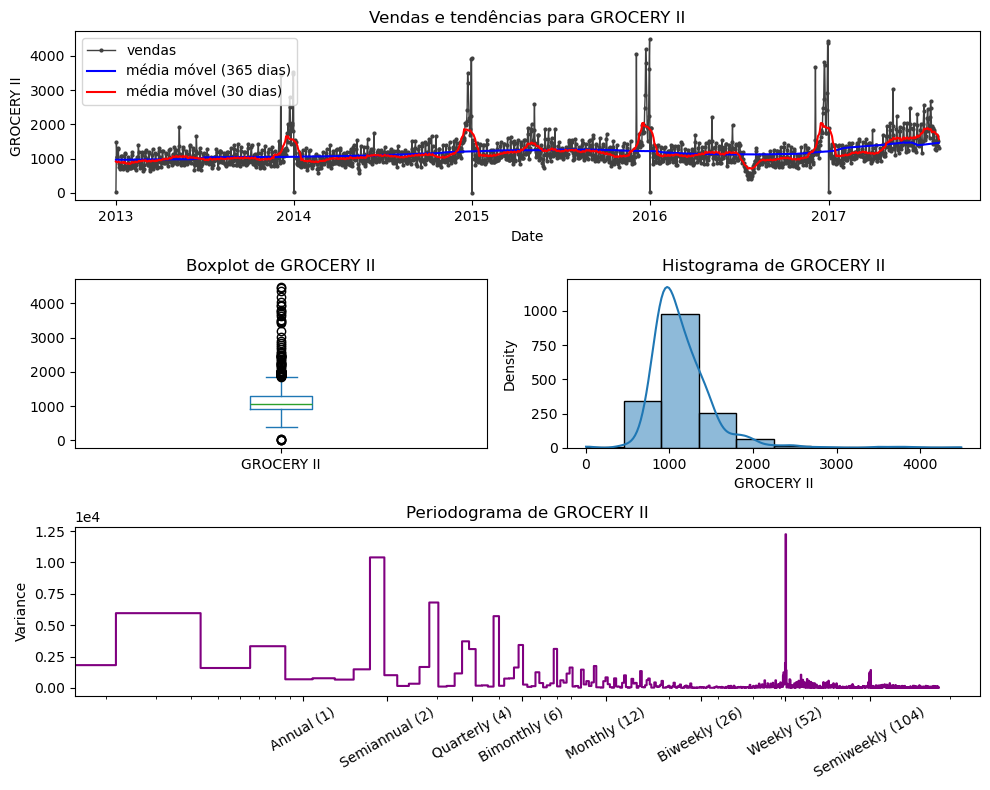

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


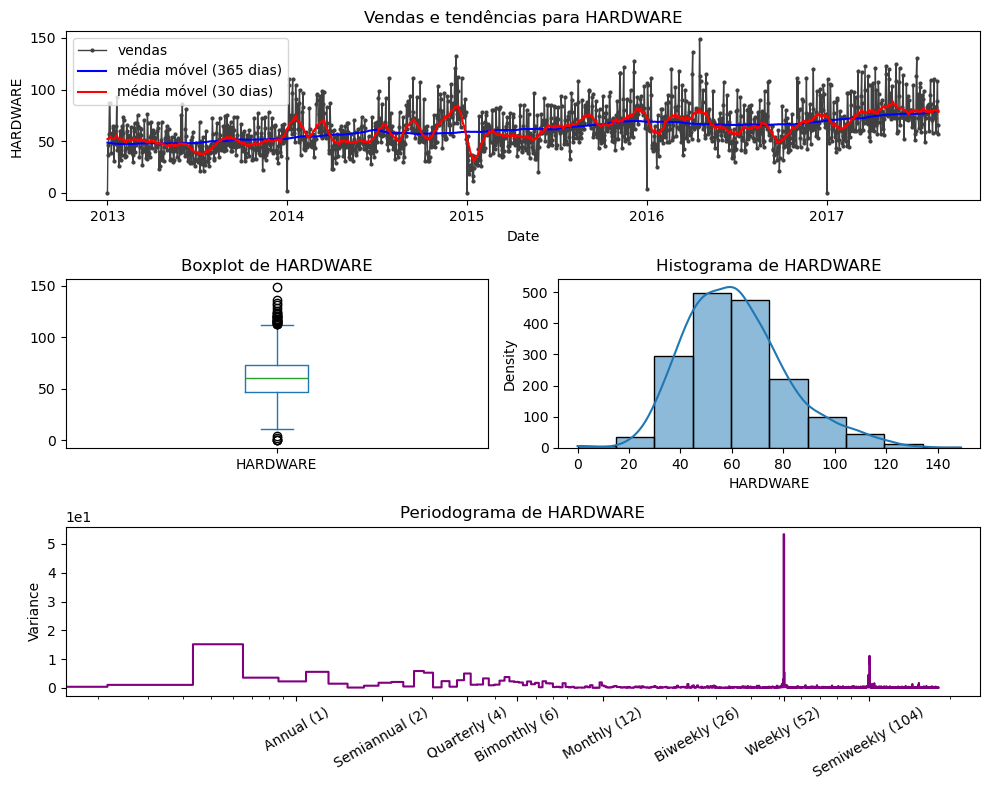

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


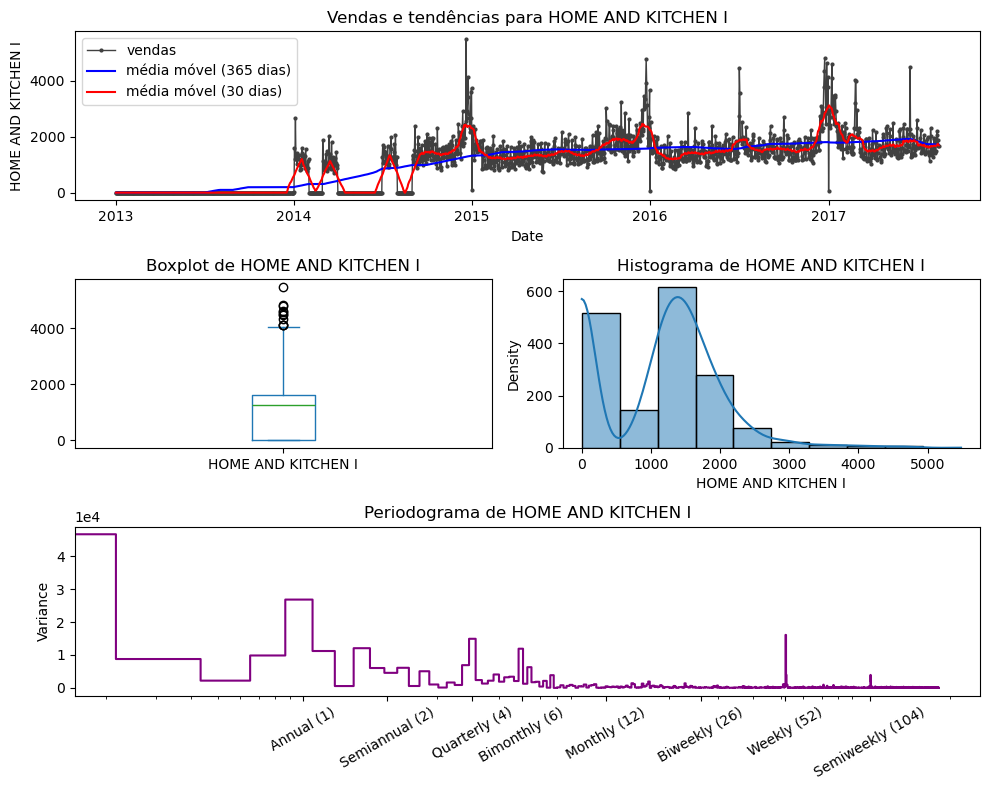

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


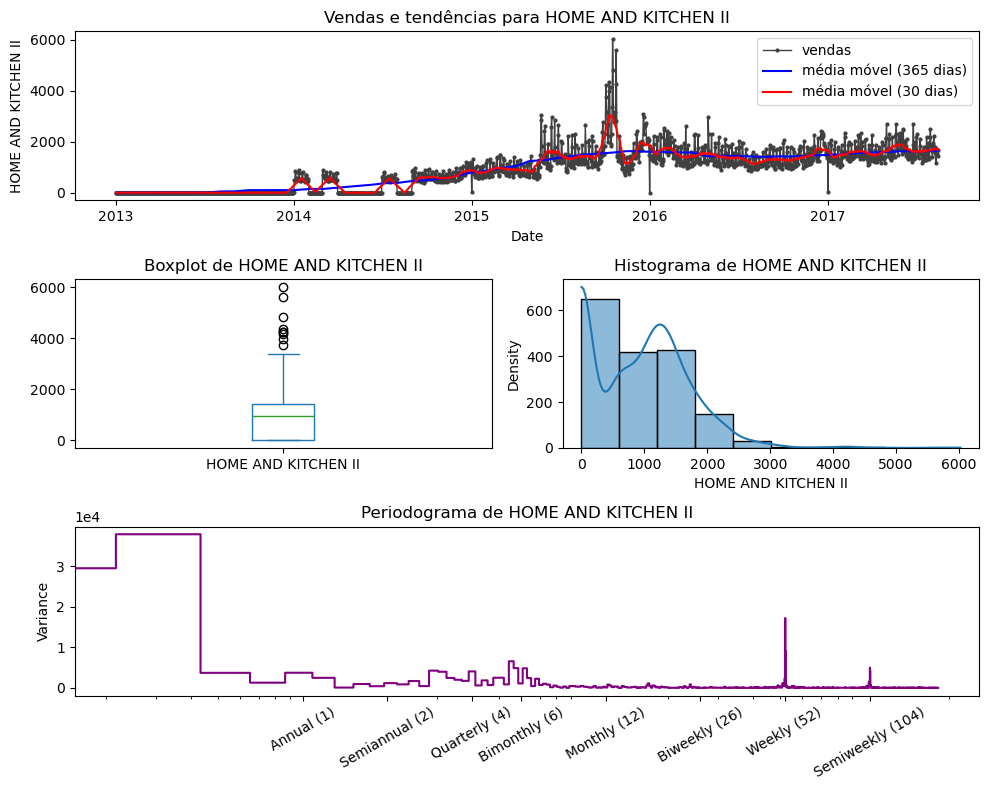

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


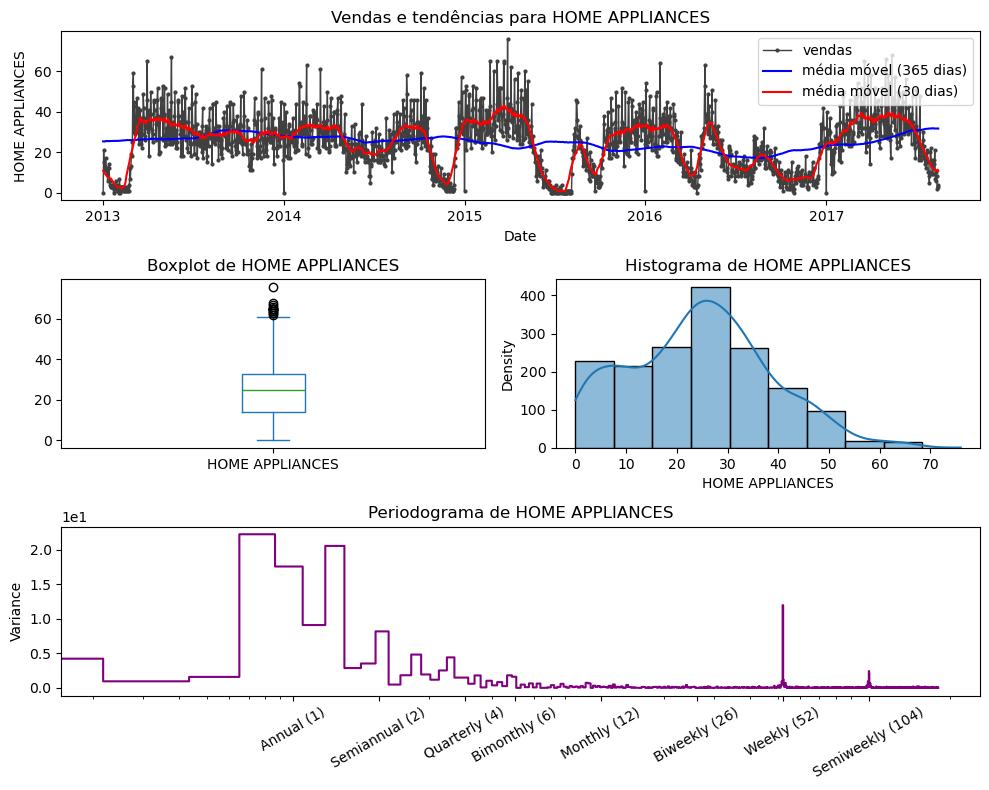

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


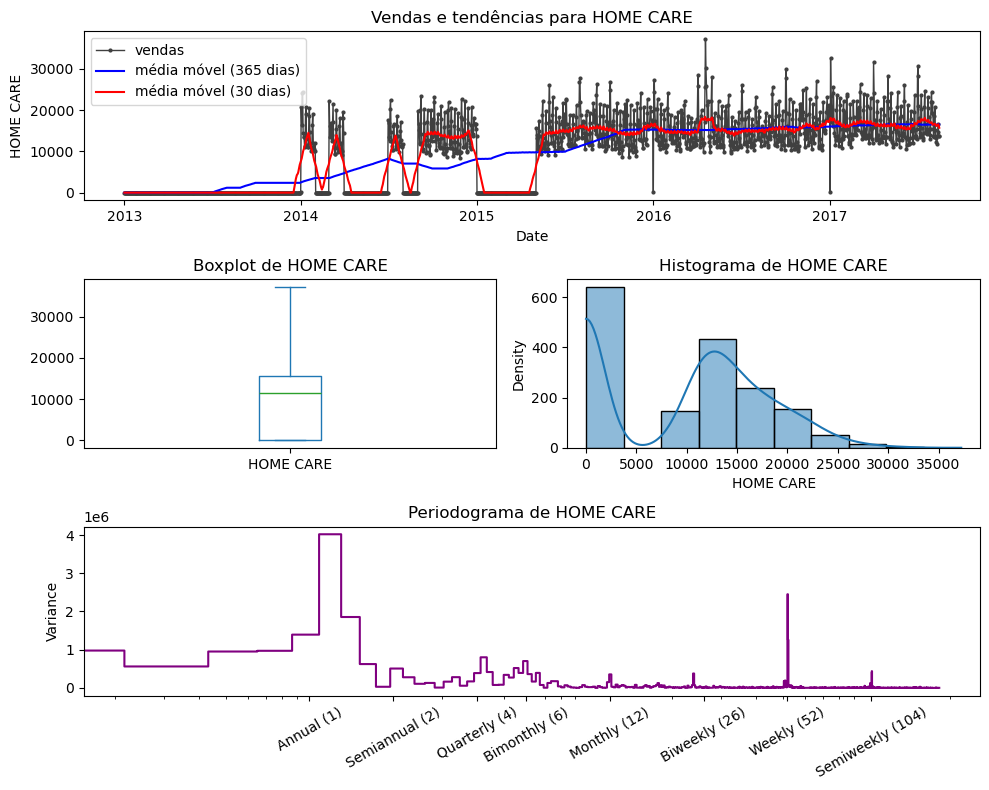

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


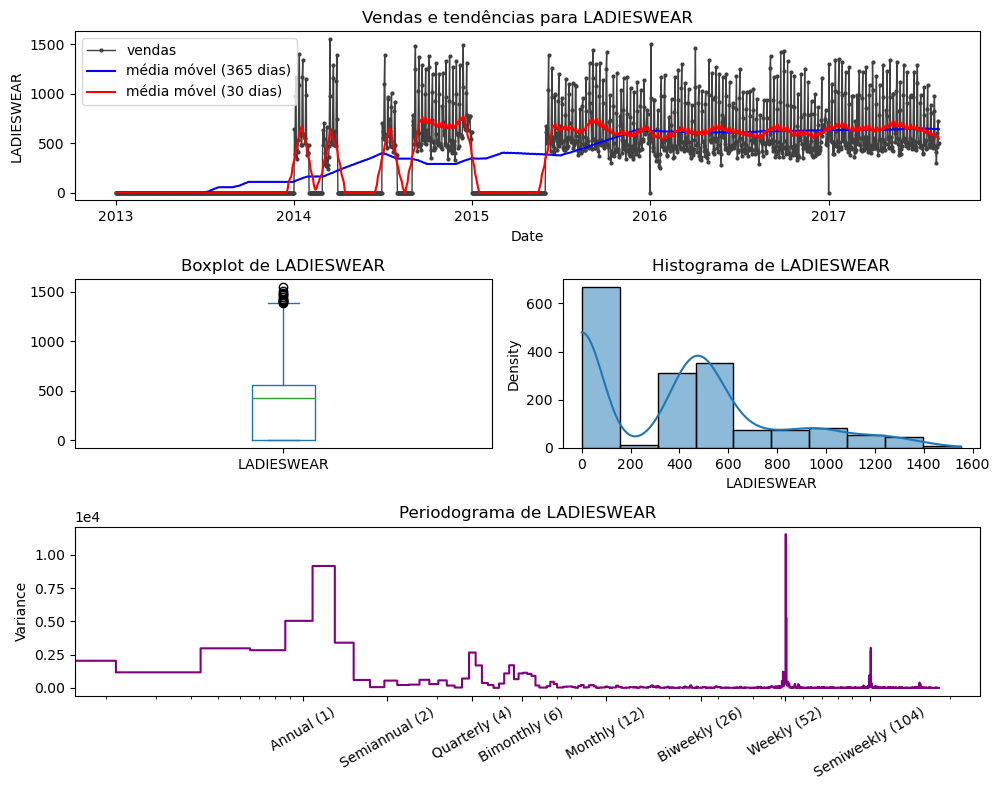

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


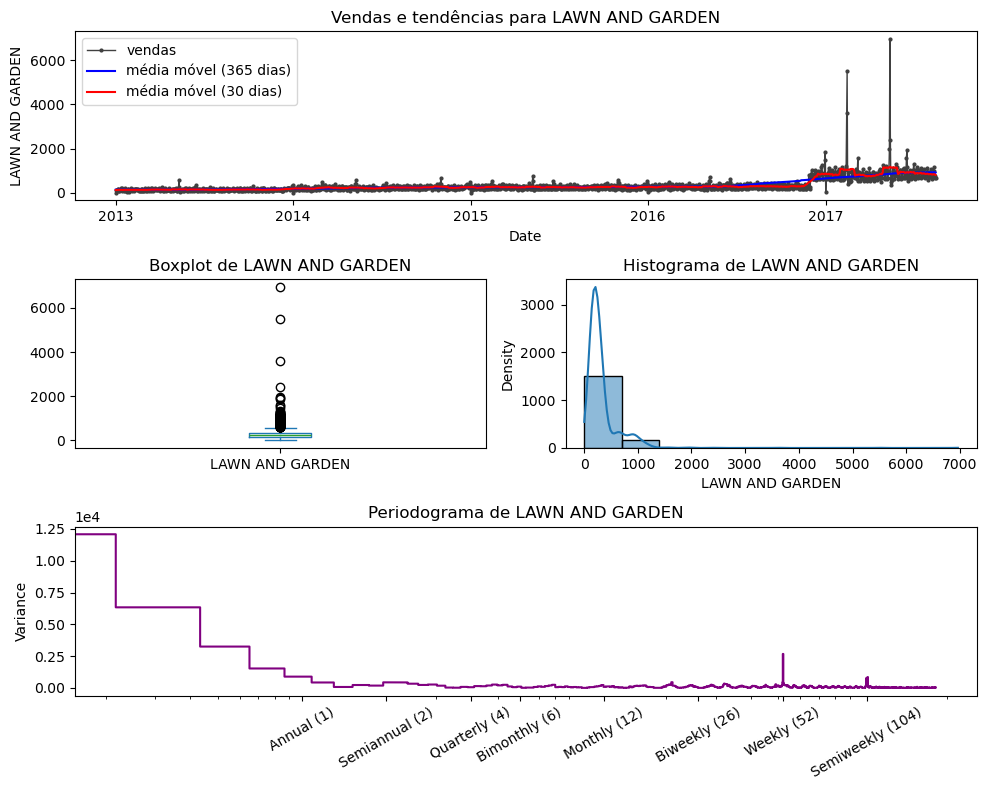

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


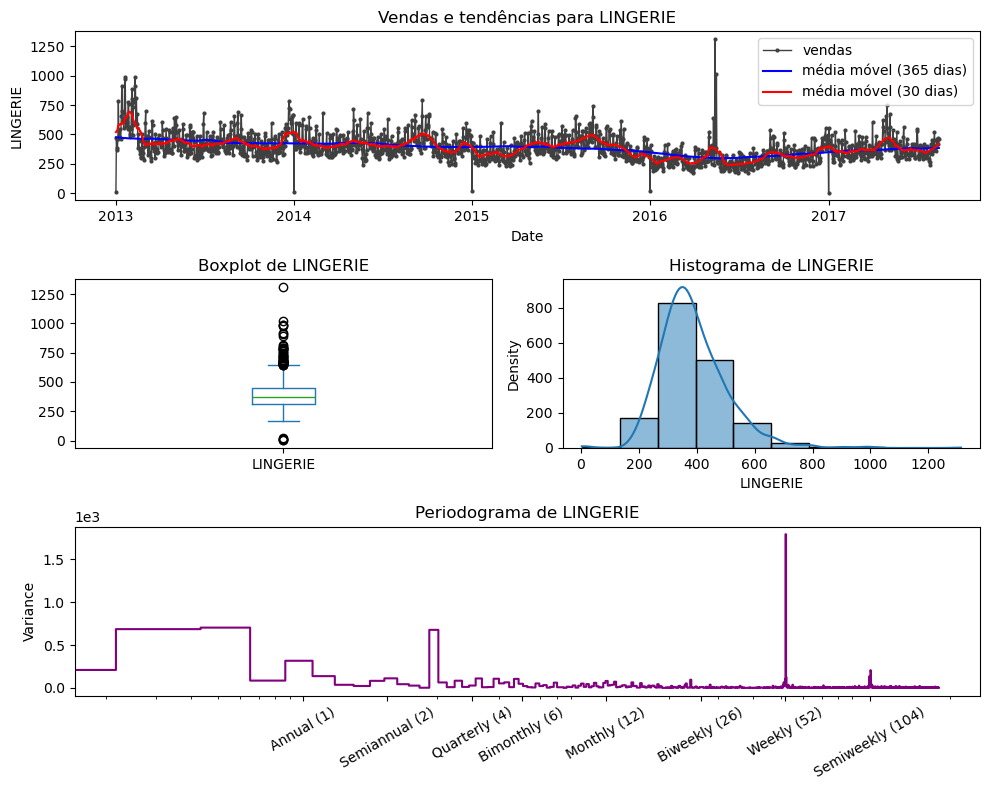

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


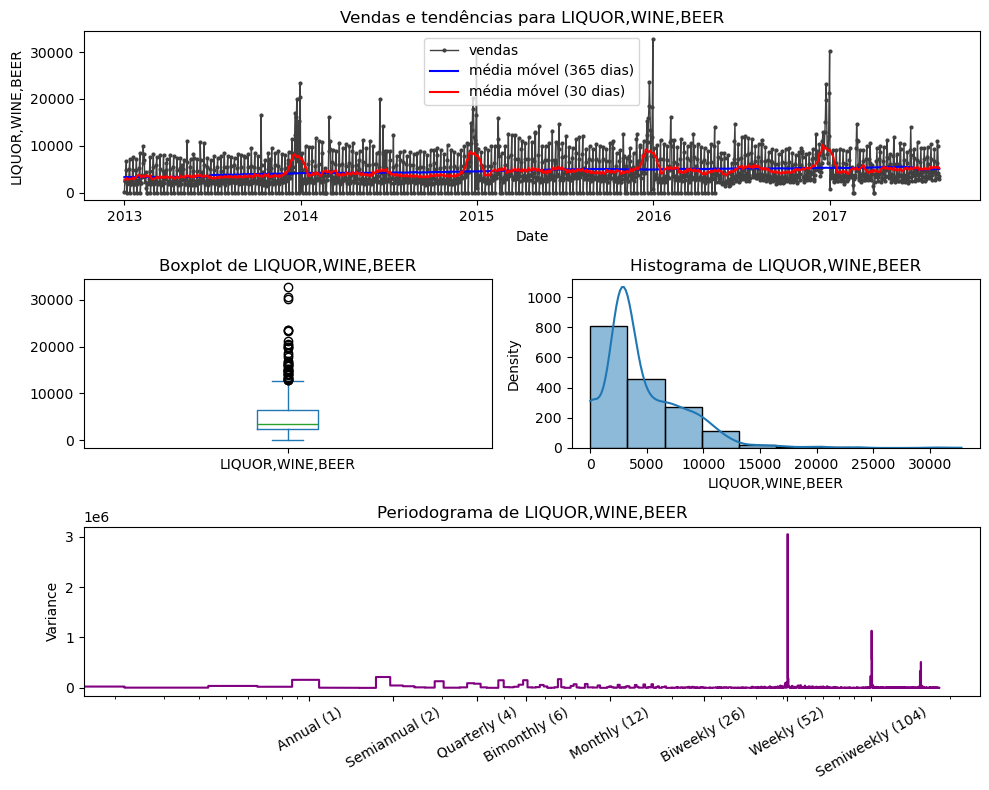

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


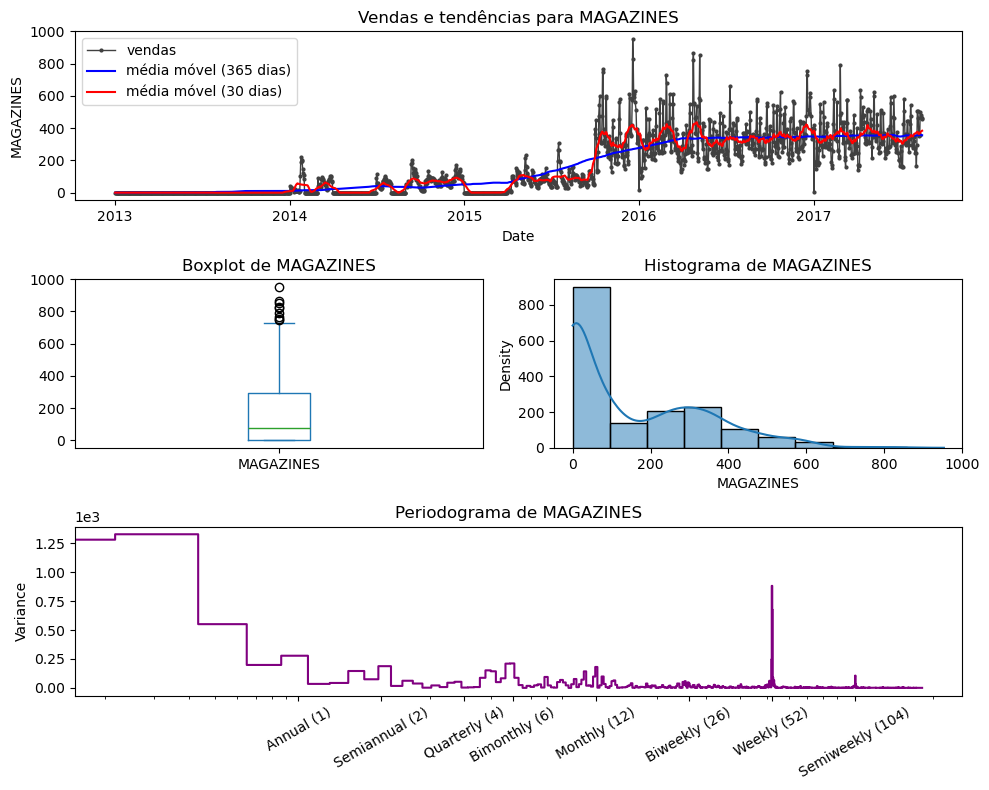

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


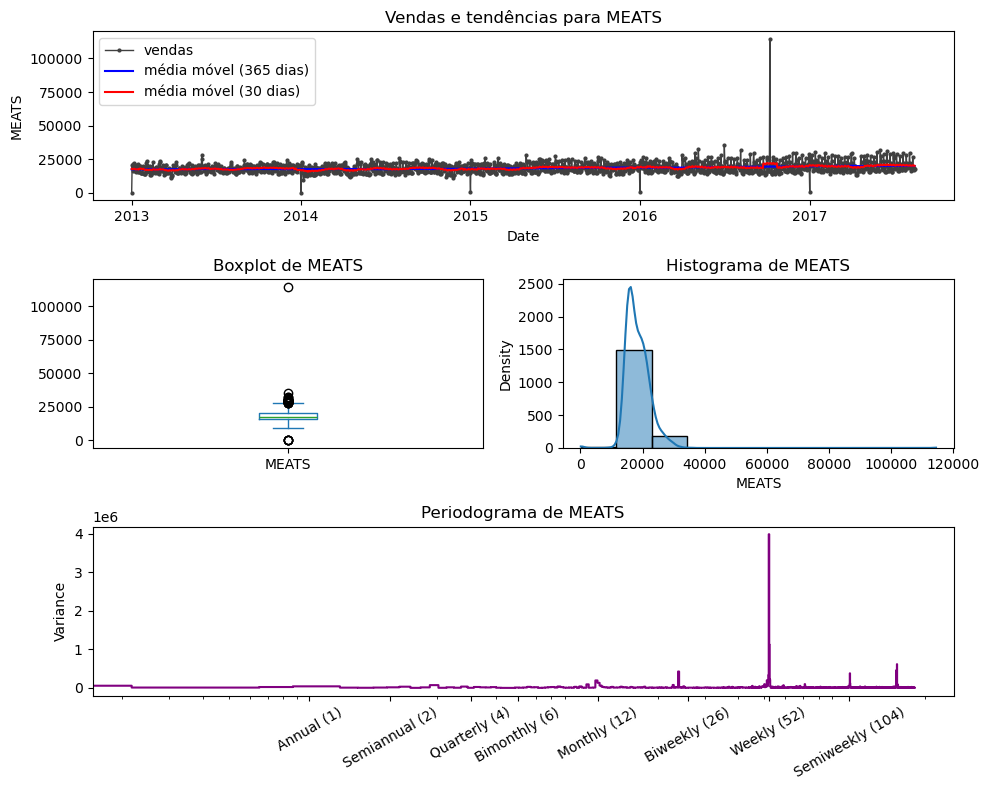

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


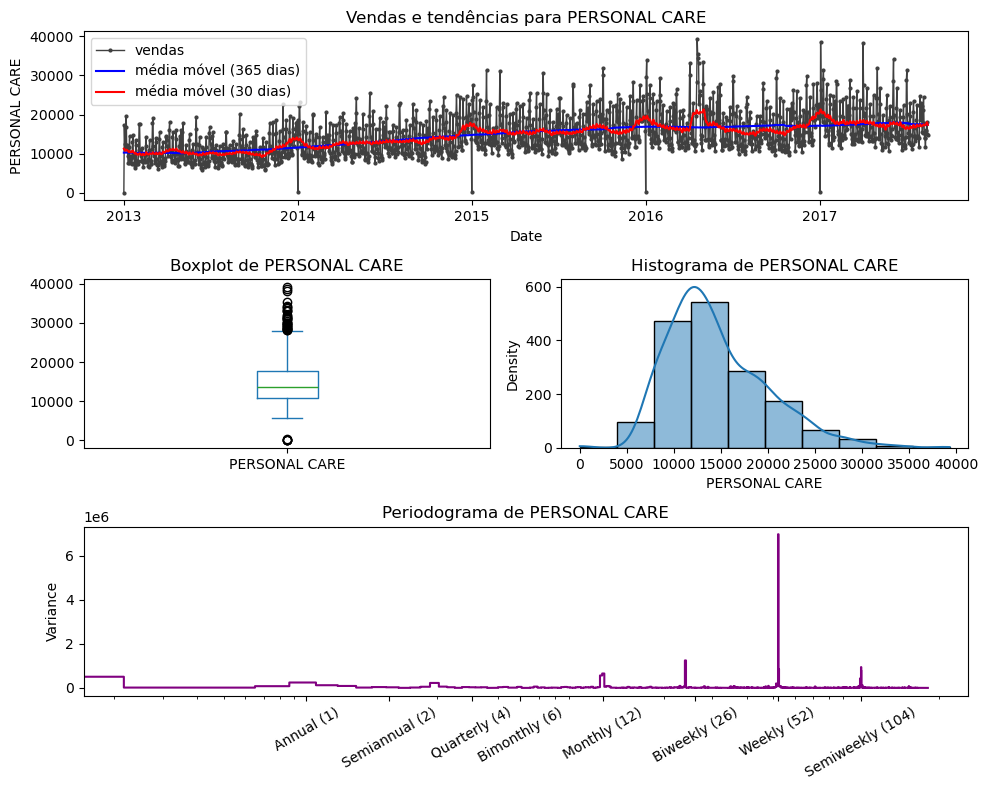

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


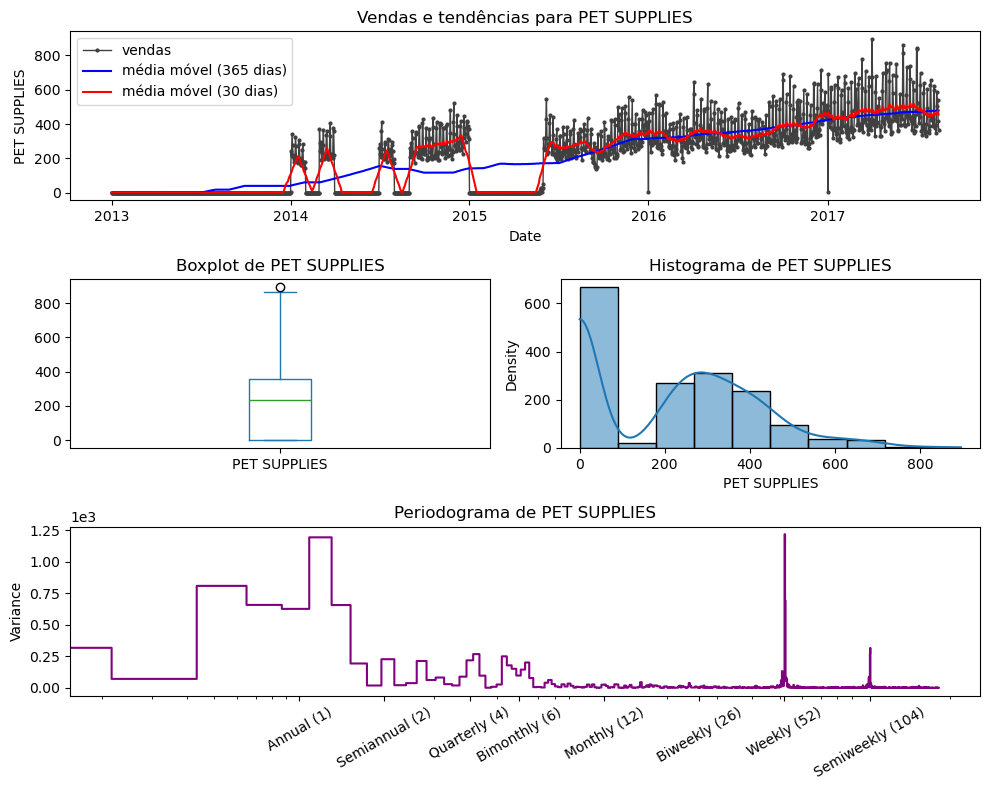

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


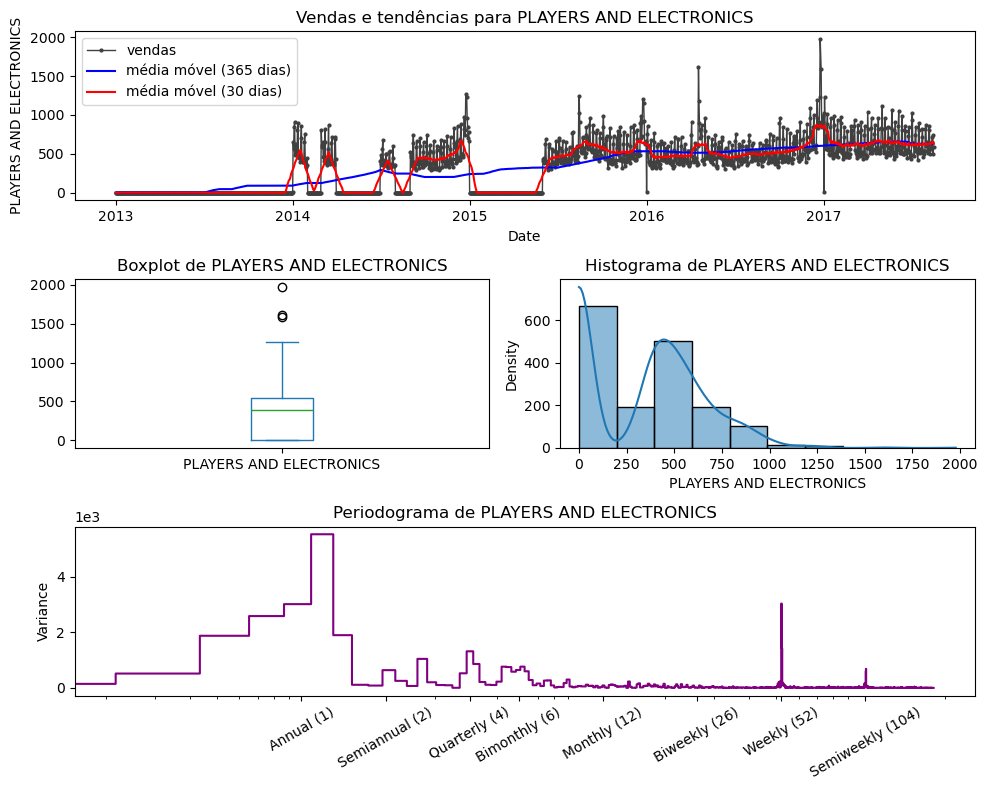

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


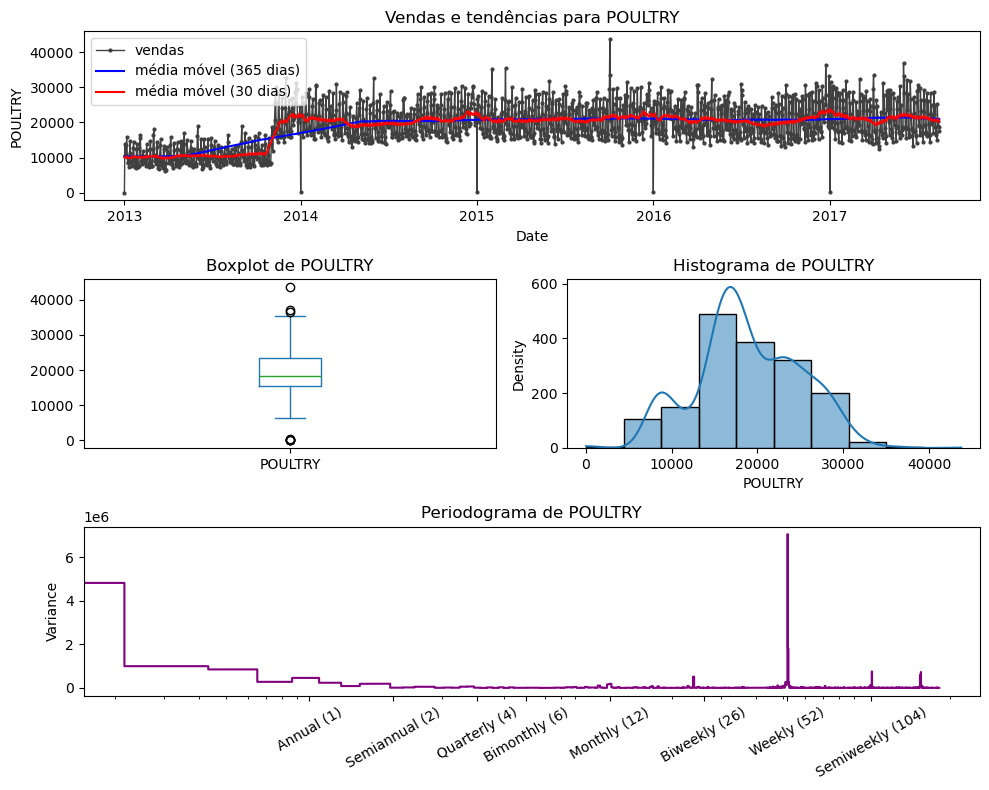

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


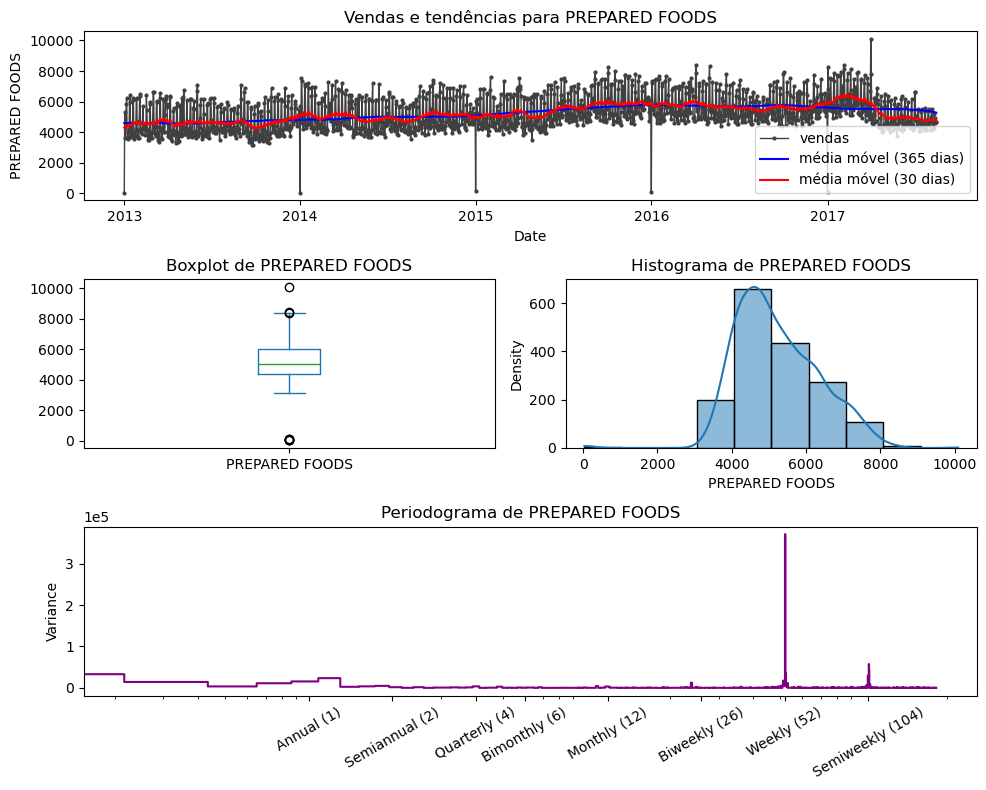

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


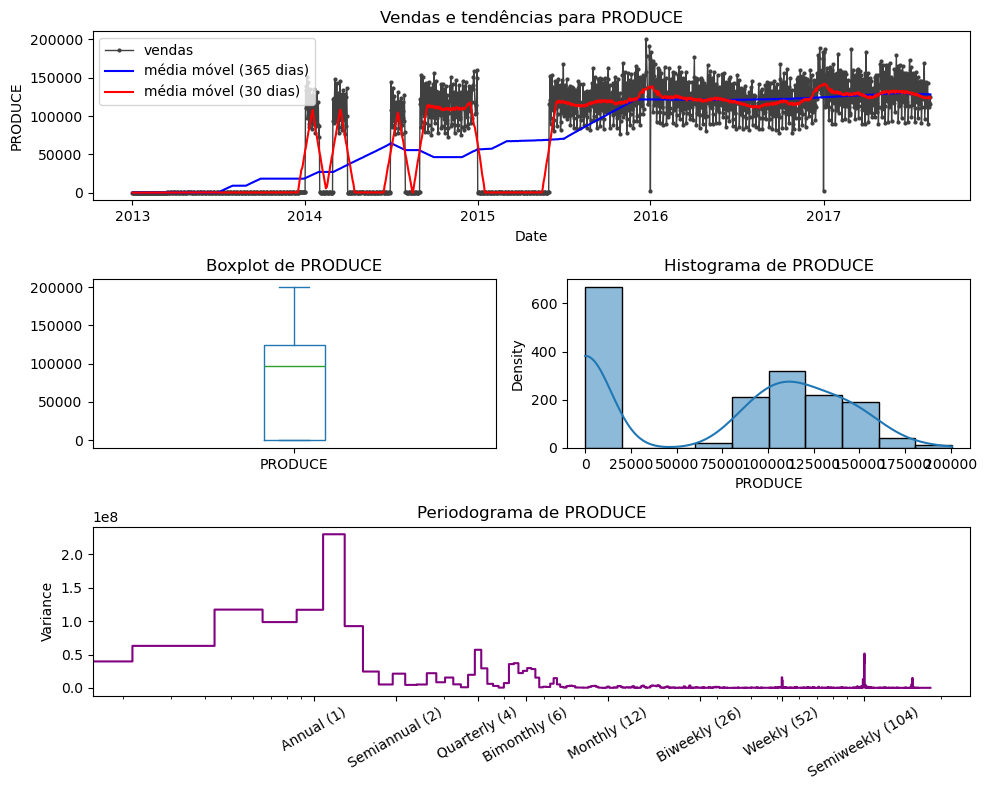

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


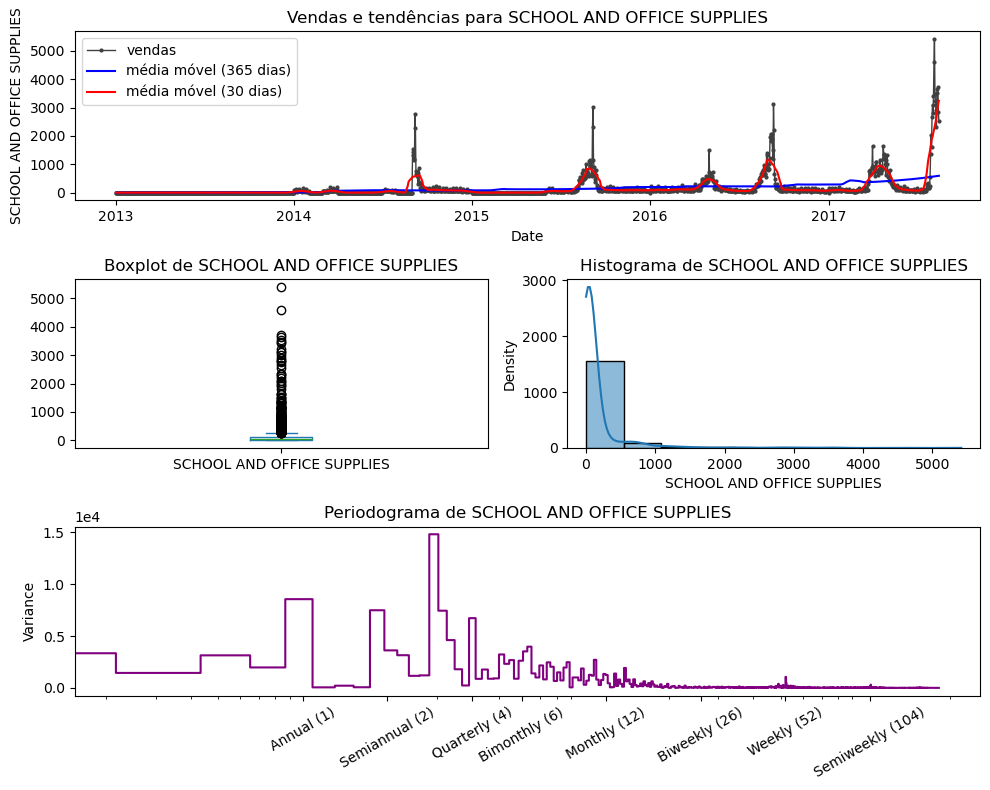

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


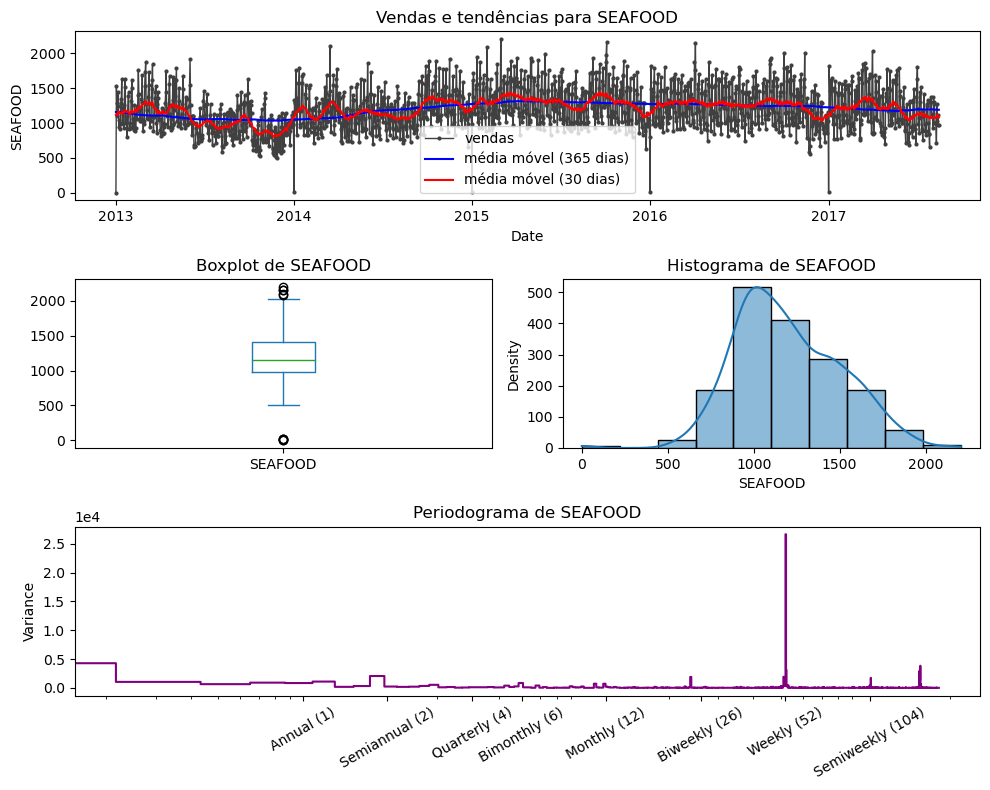

In [7]:
eda.all_families_analysis()

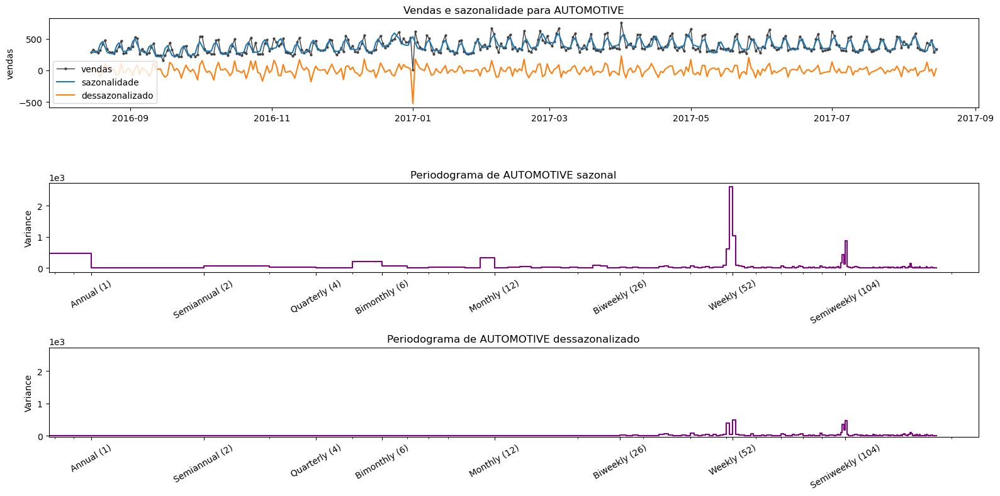

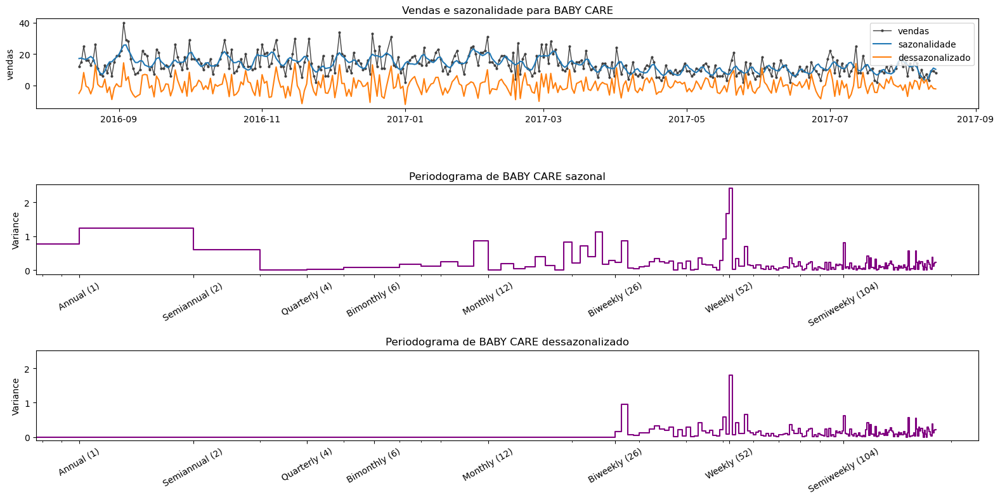

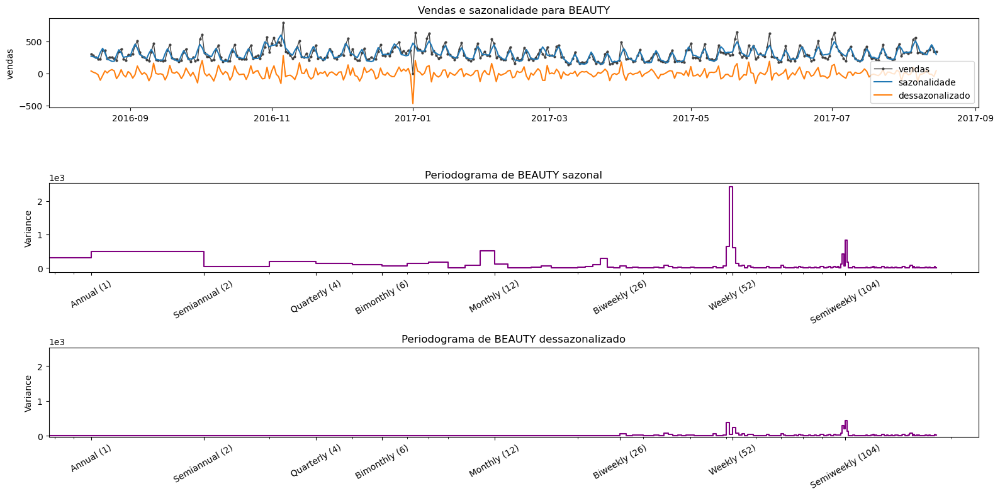

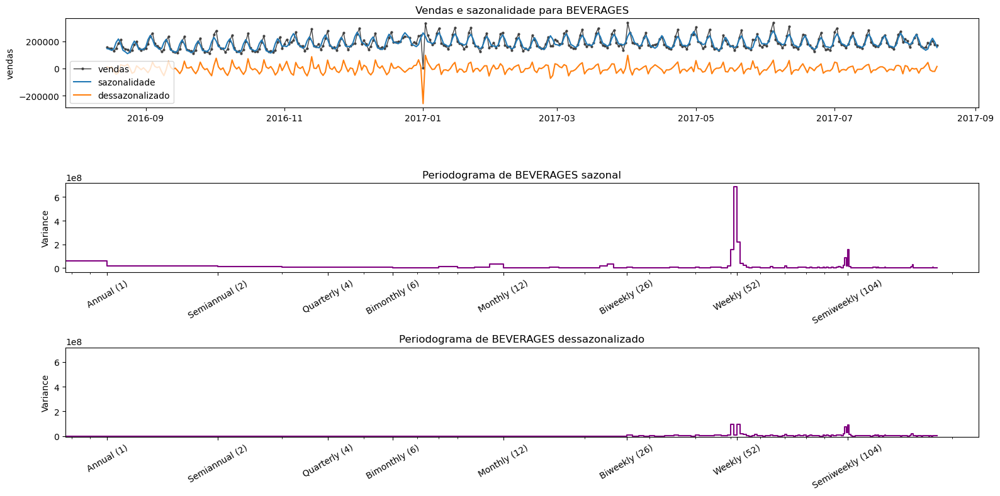

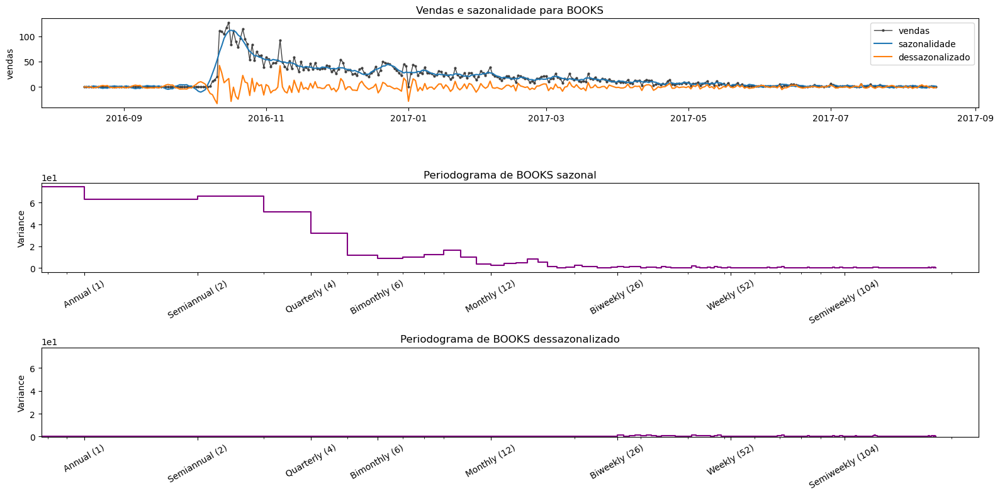

...

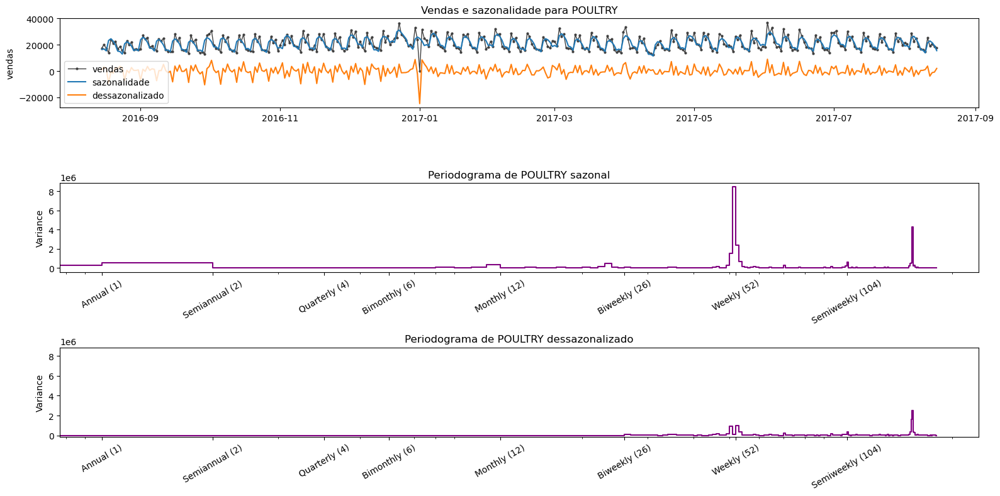

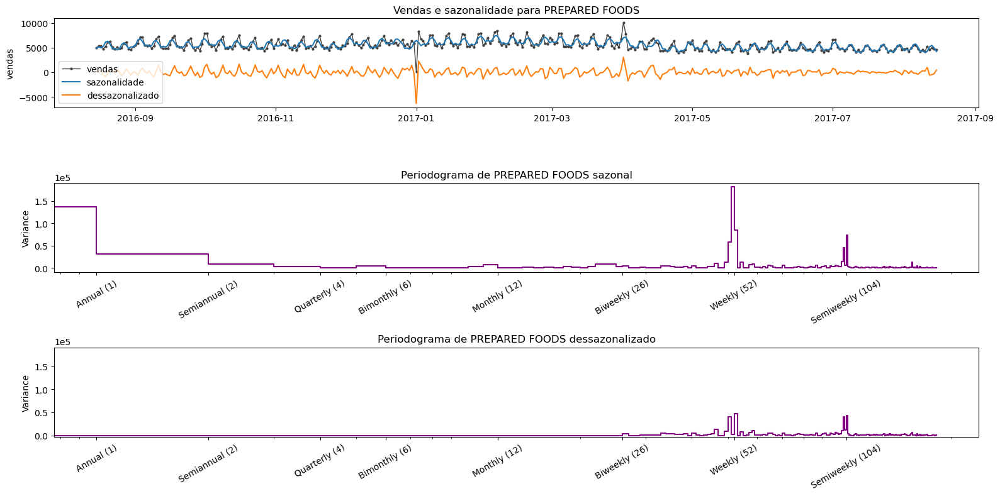

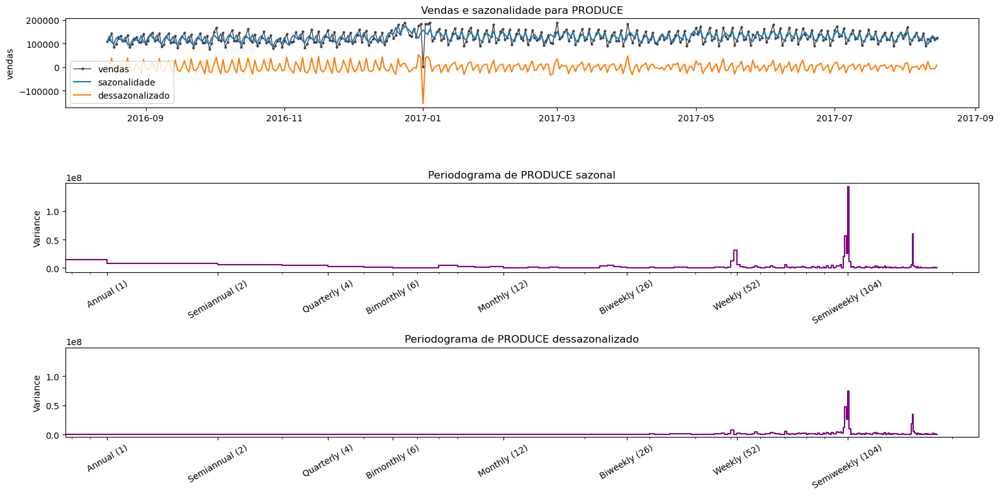

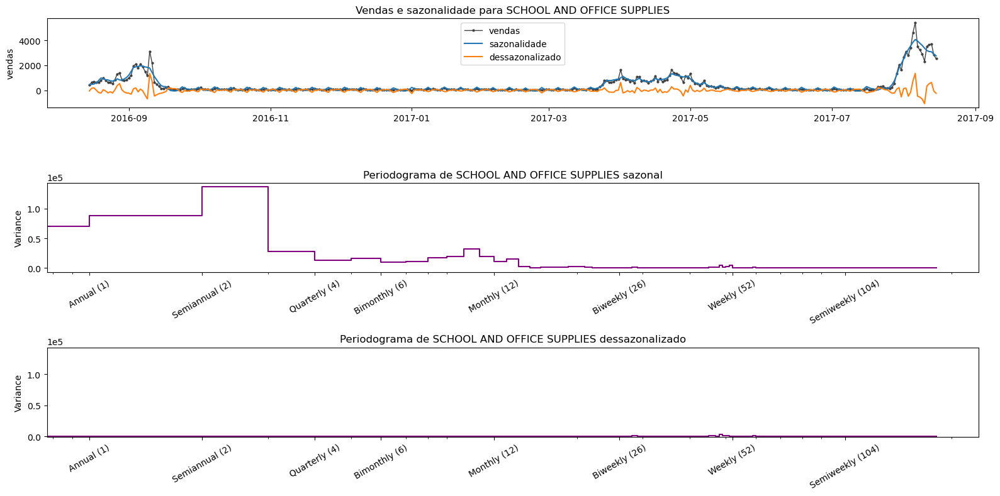

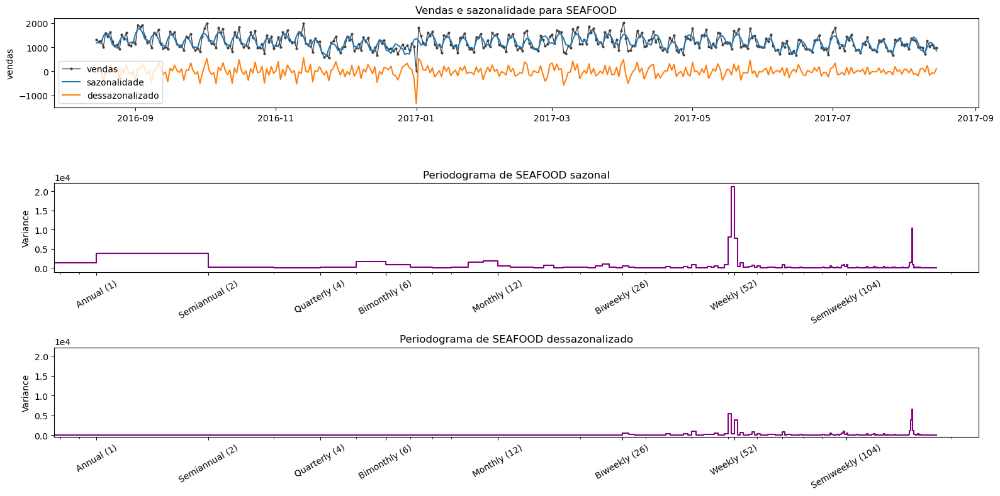

In [8]:
eda = EDA('train.csv', initial = '2016-08-15')
eda.all_families_deseason('A', 26)

3


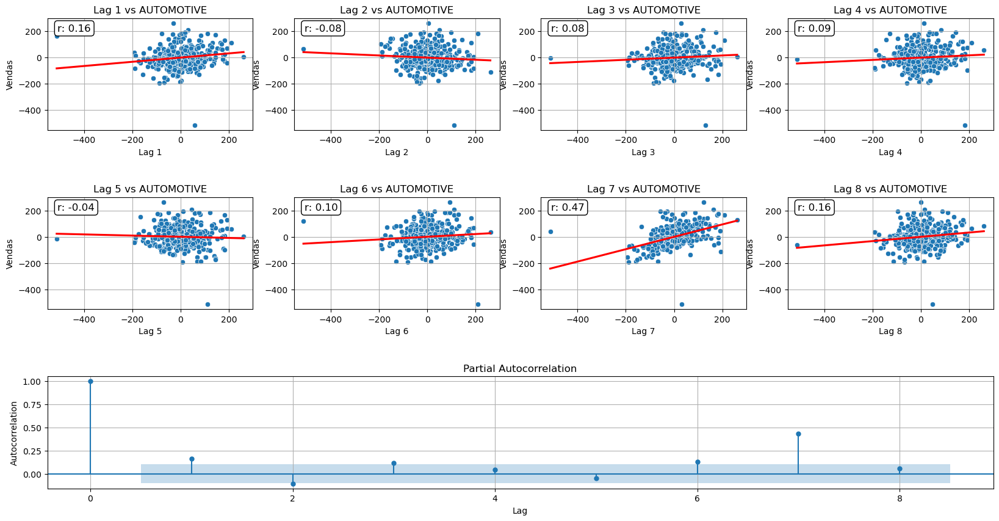

3


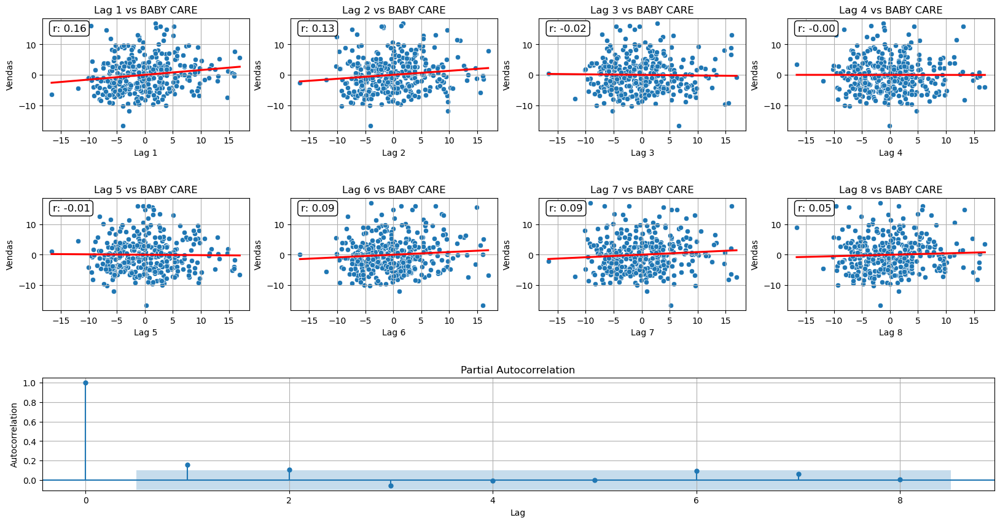

3


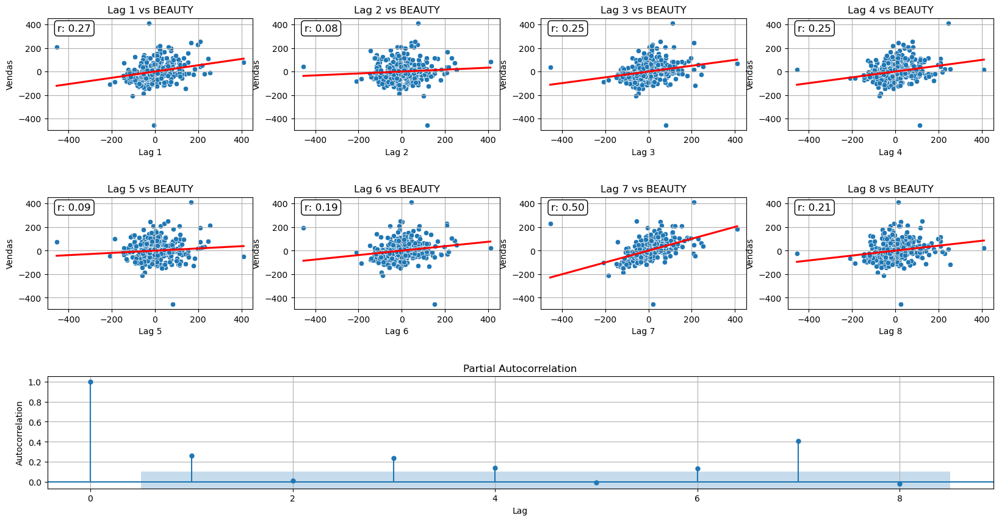

3


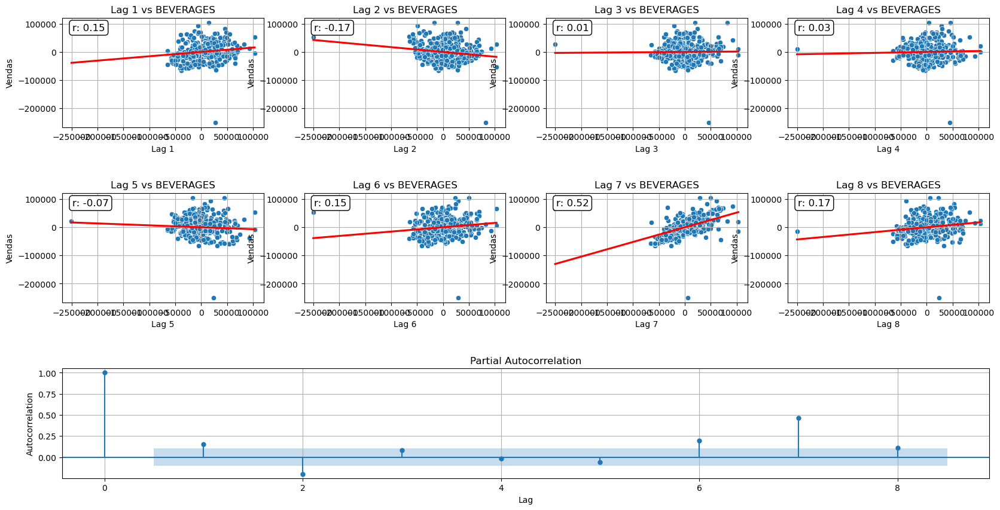

3


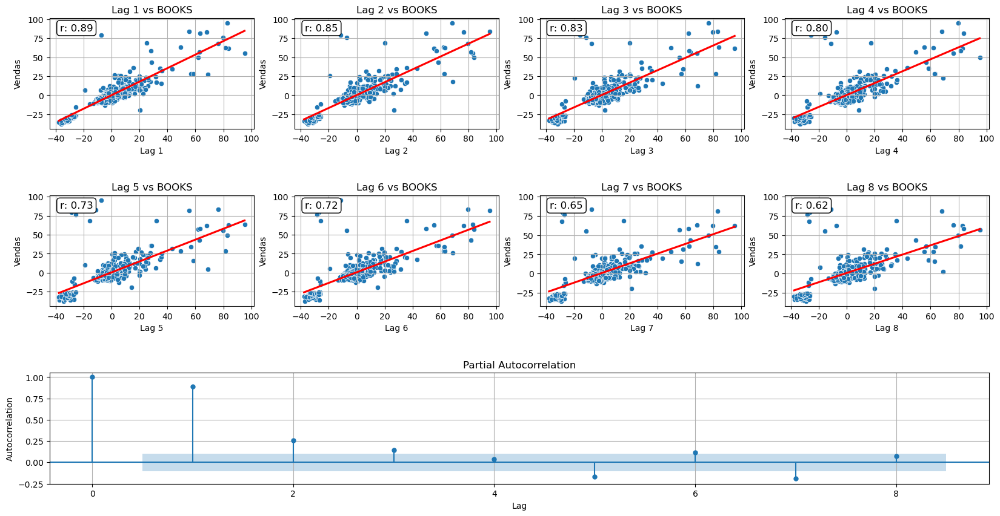

3


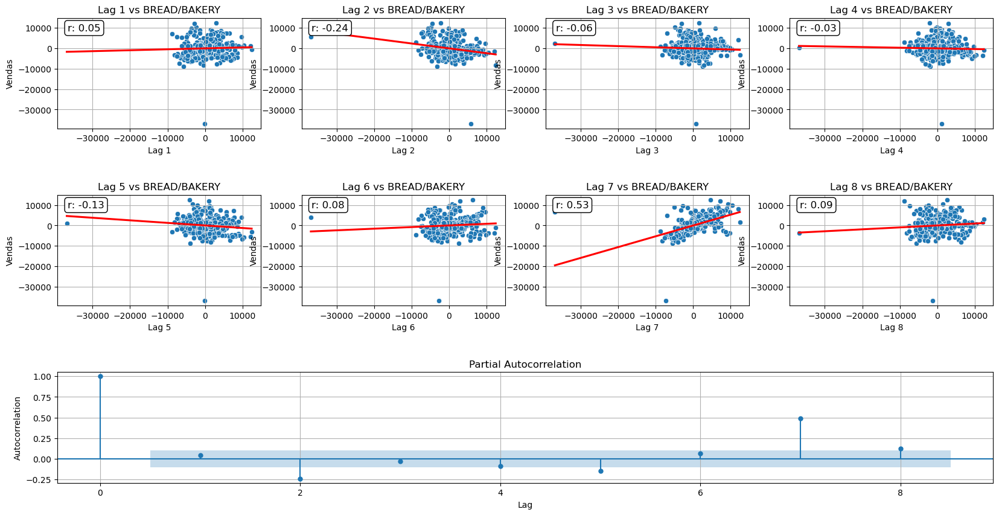

3


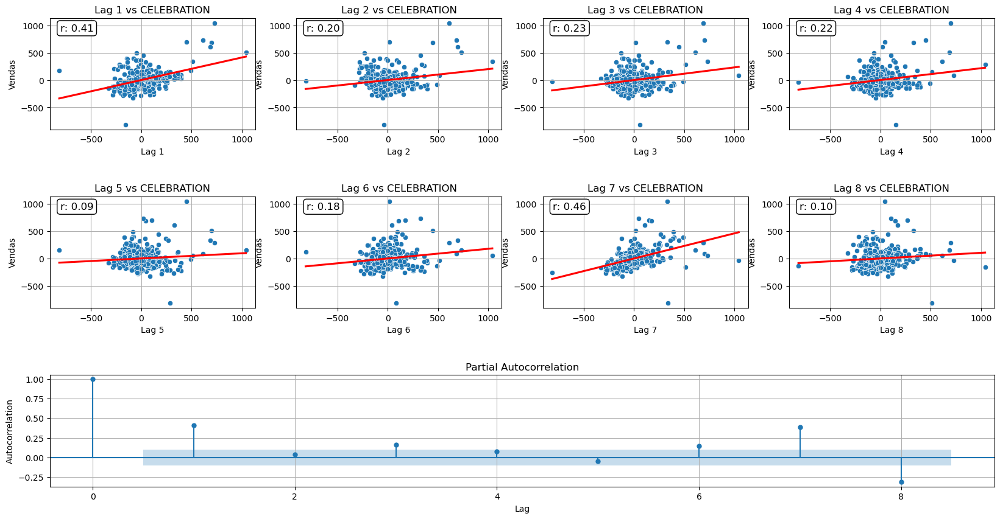

3


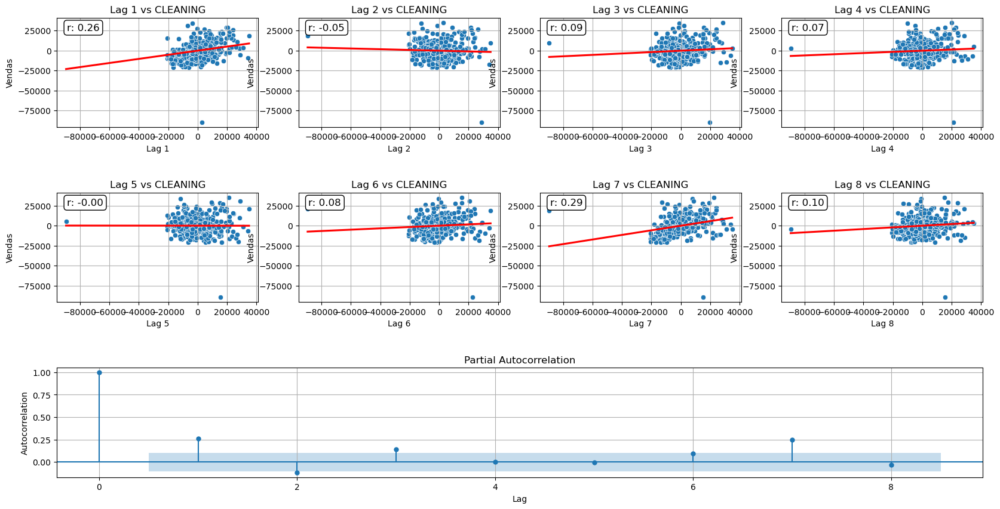

3


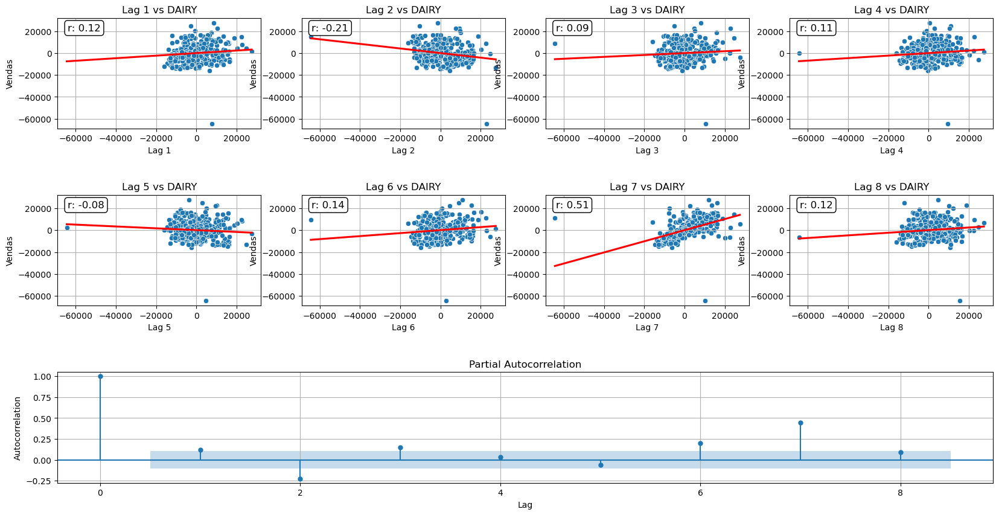

3


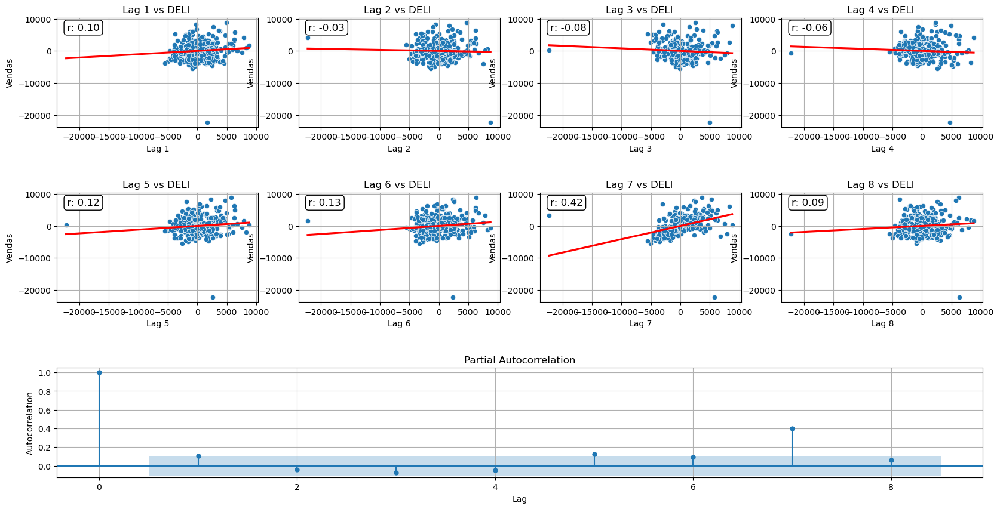

3


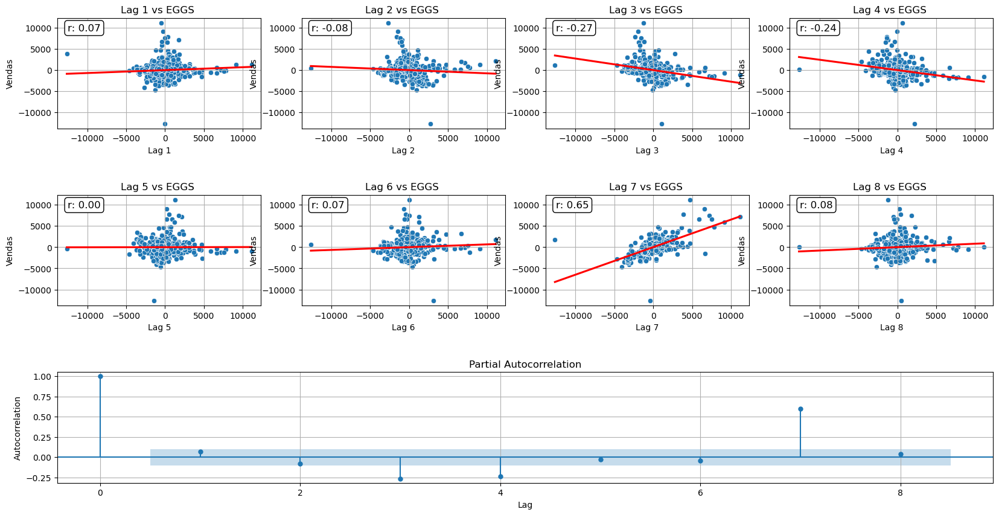

3


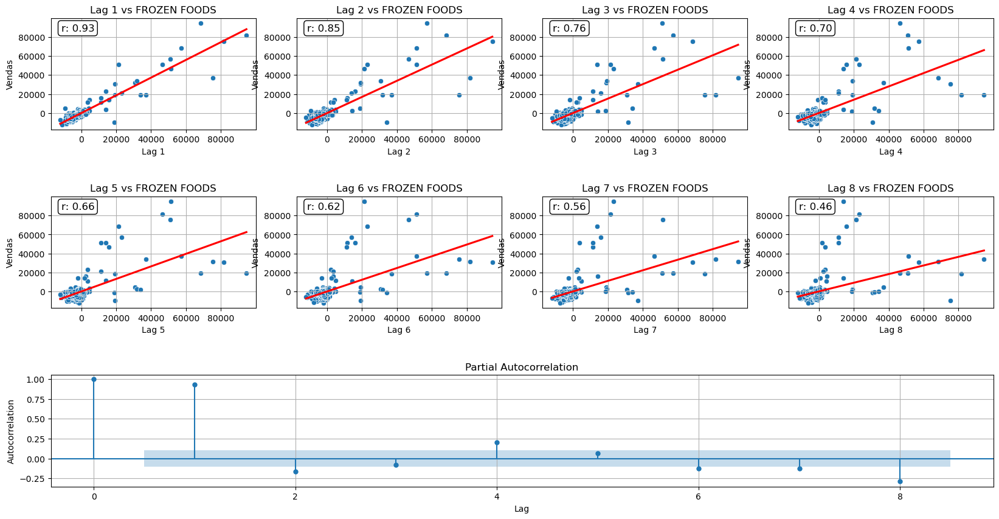

3


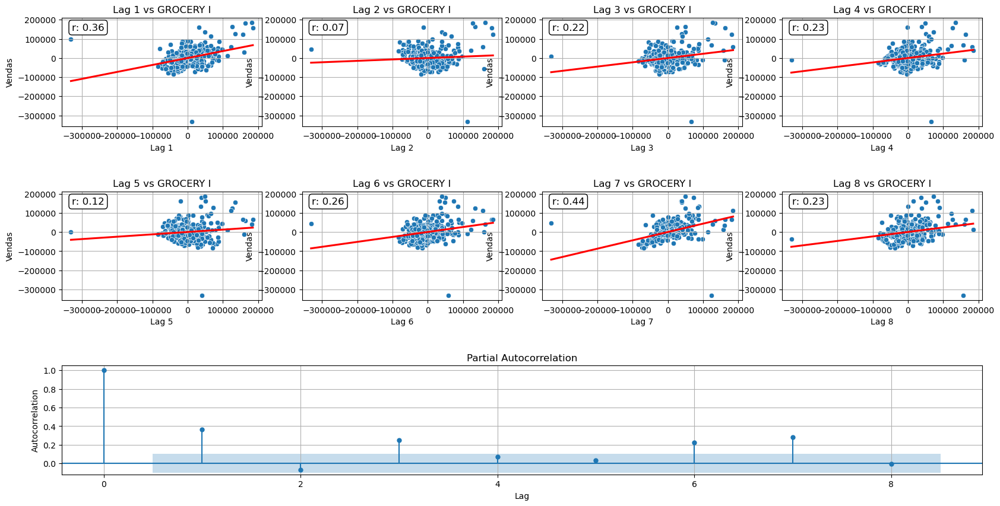

3


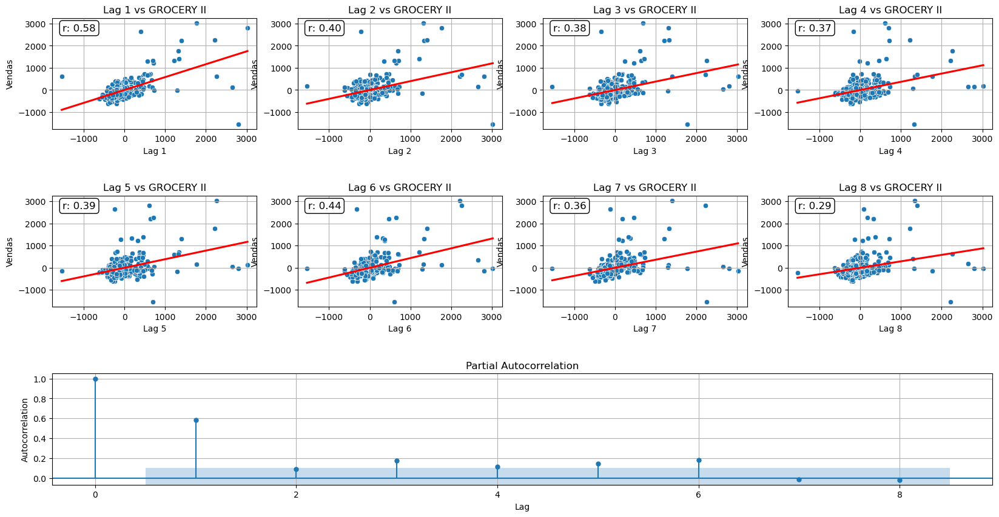

3


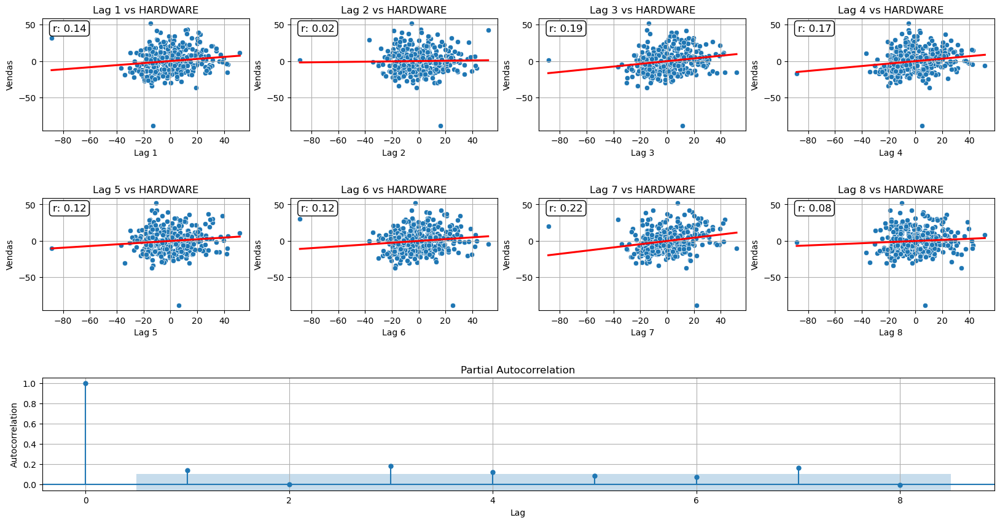

3


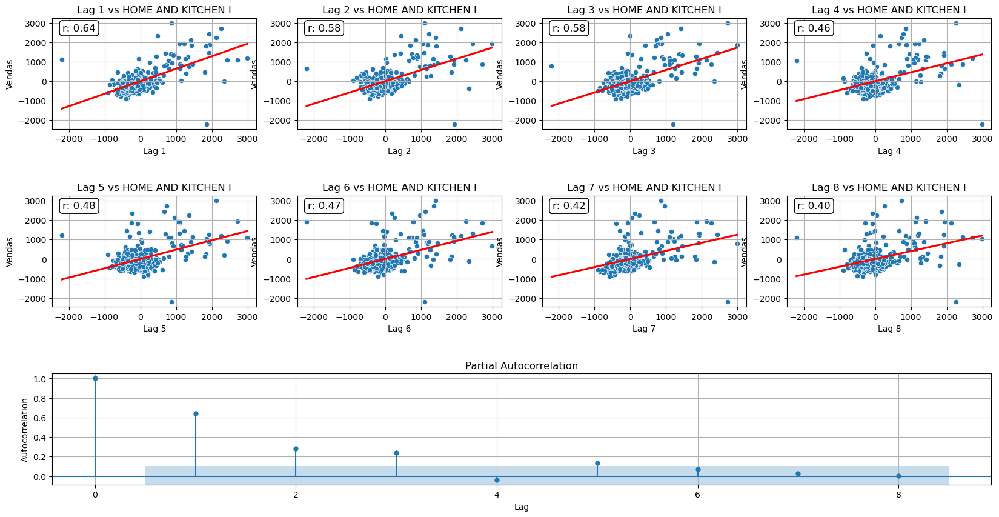

3


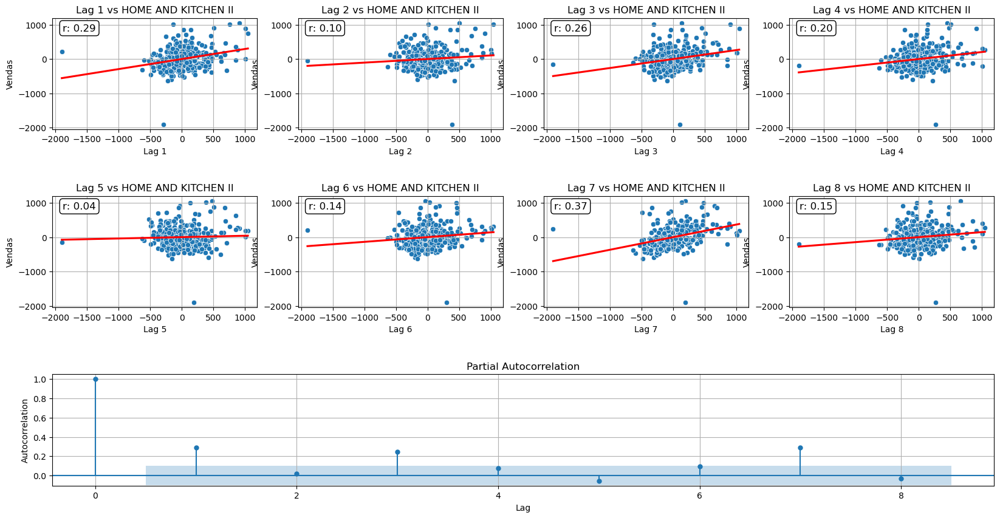

3


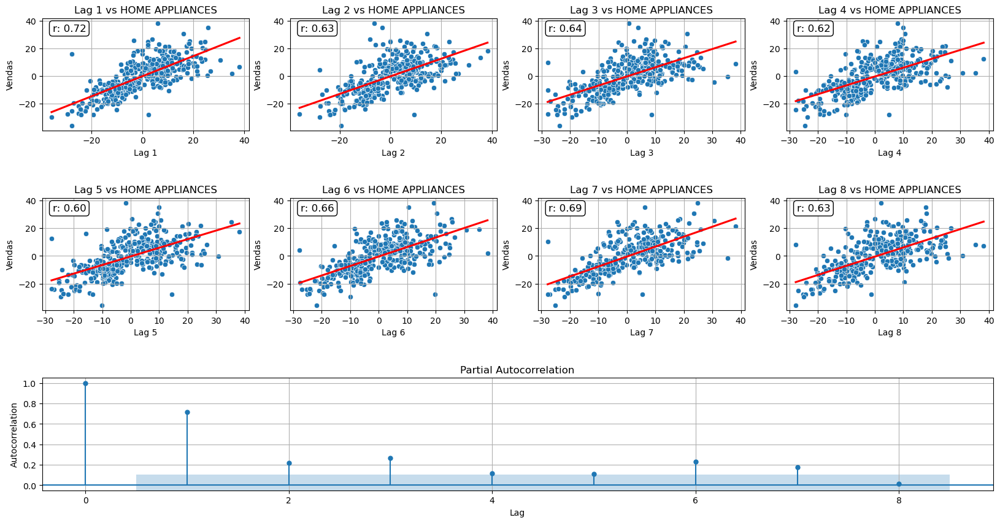

3


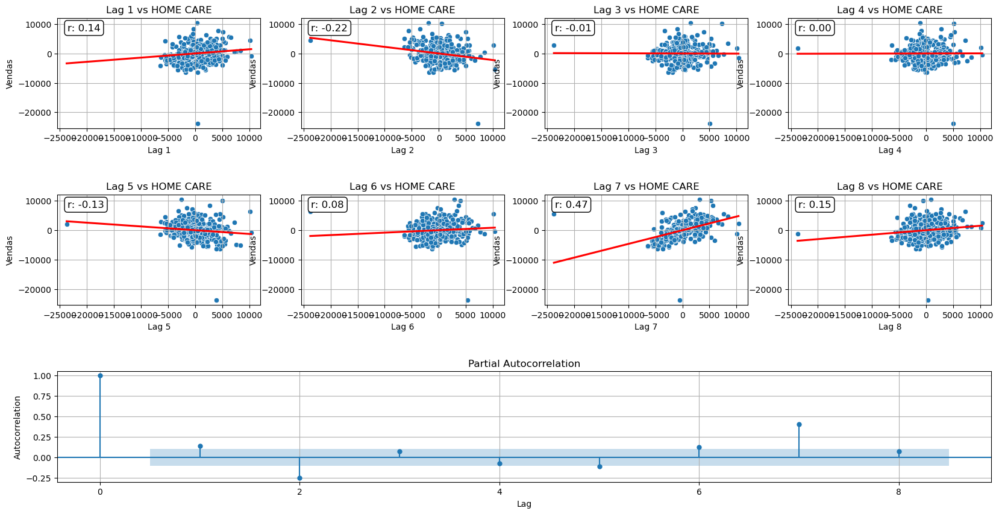

3


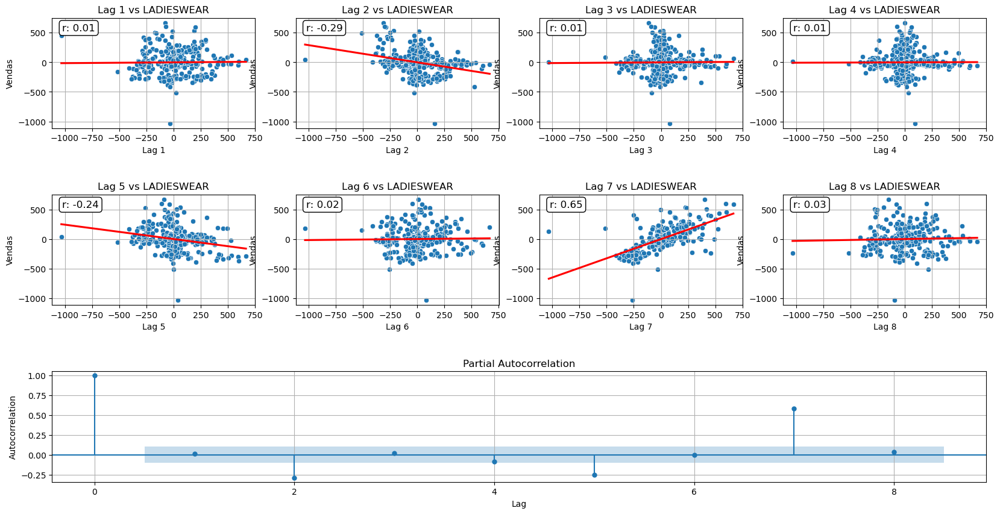

3


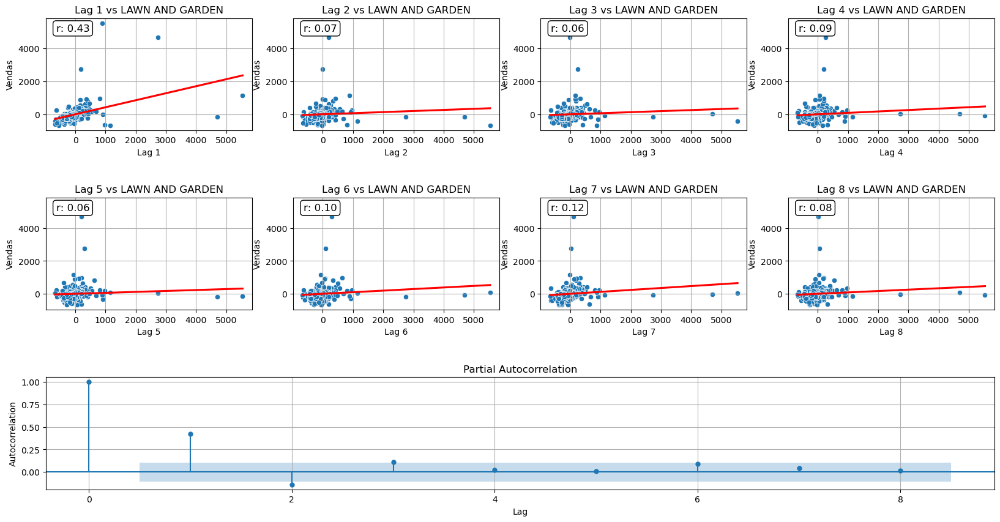

3


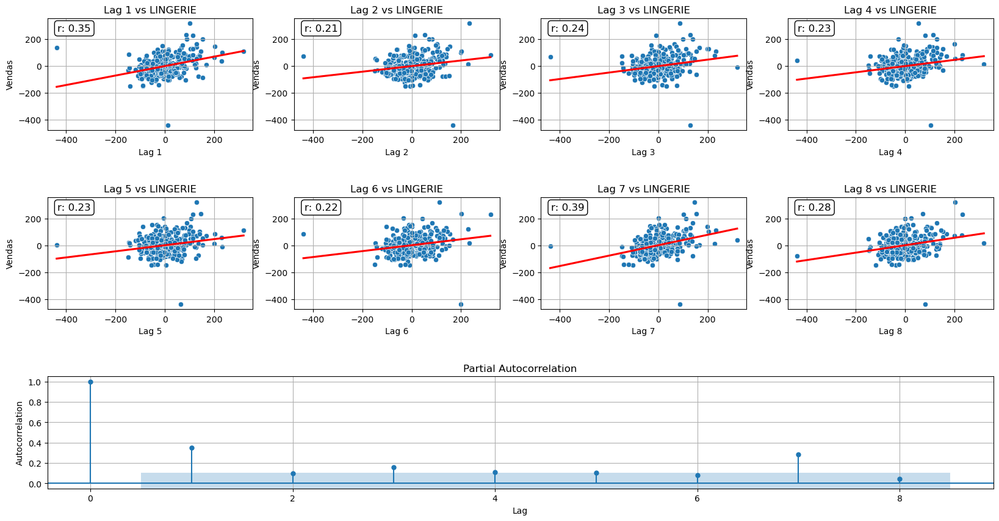

3


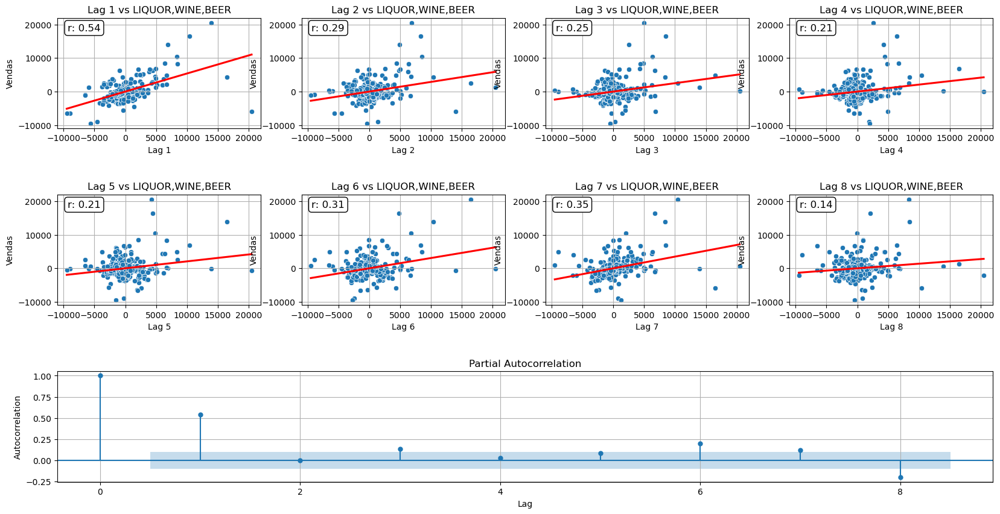

3


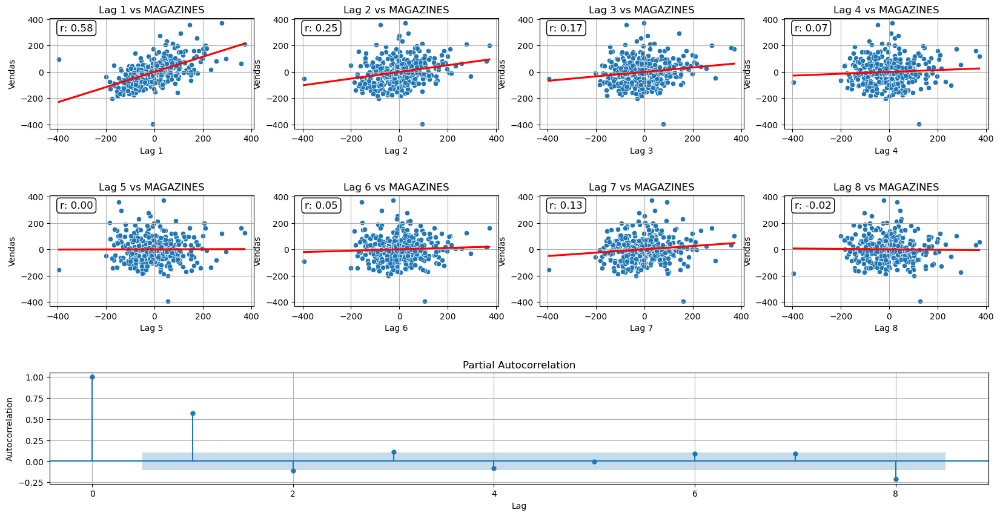

3


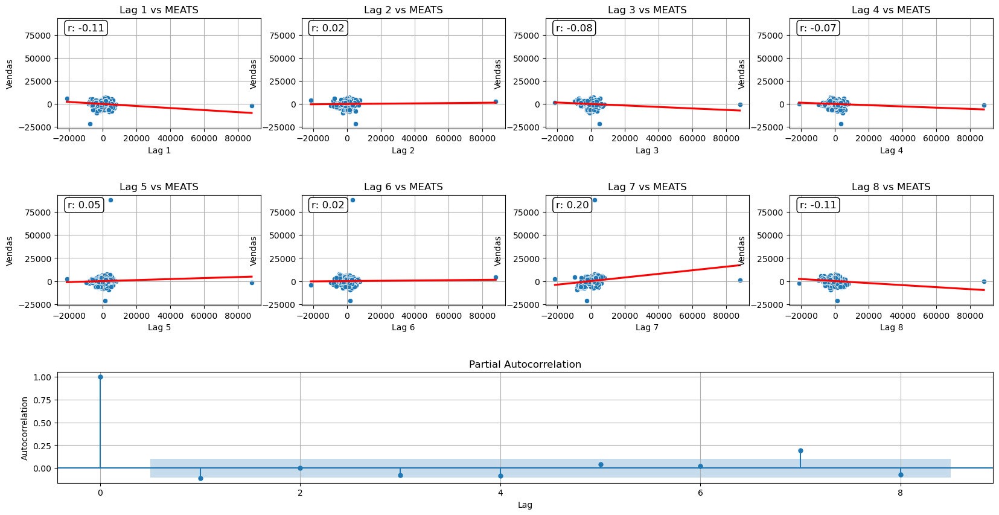

3


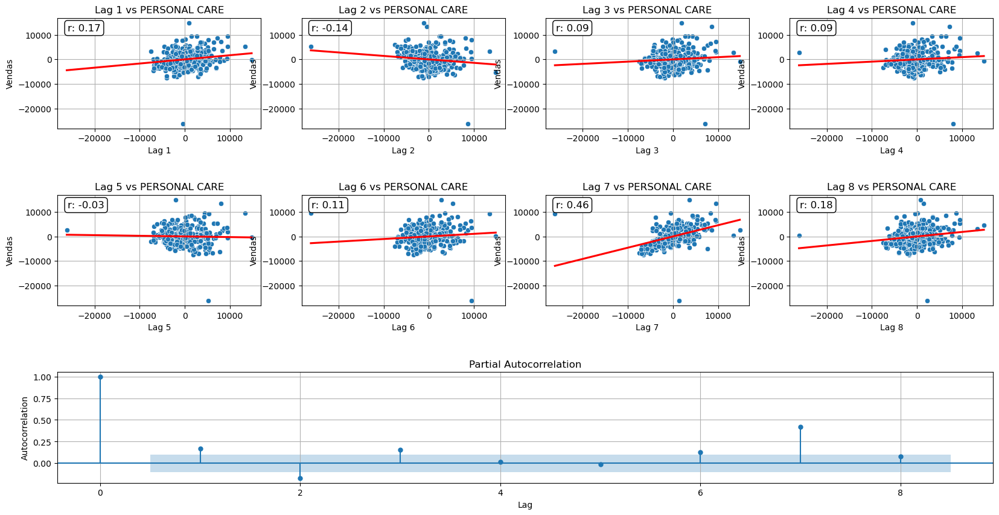

3


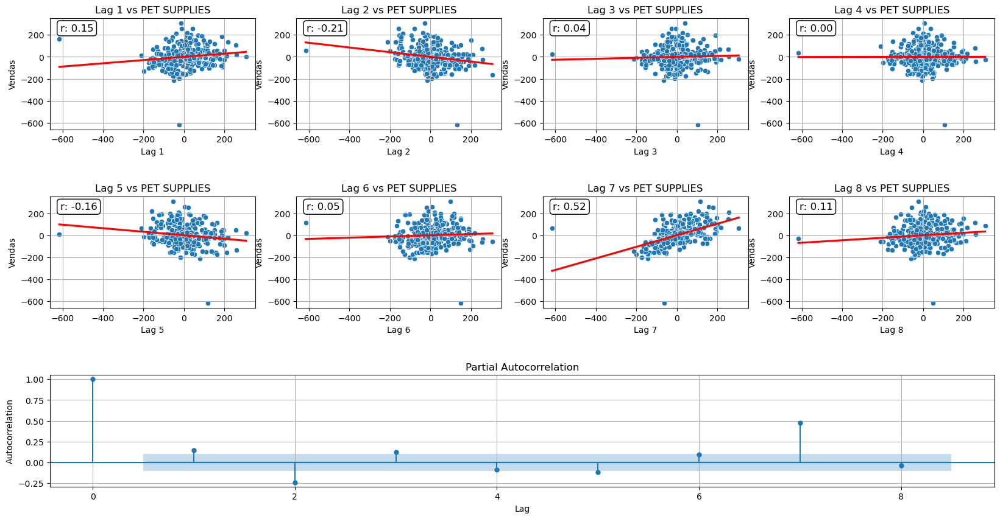

3


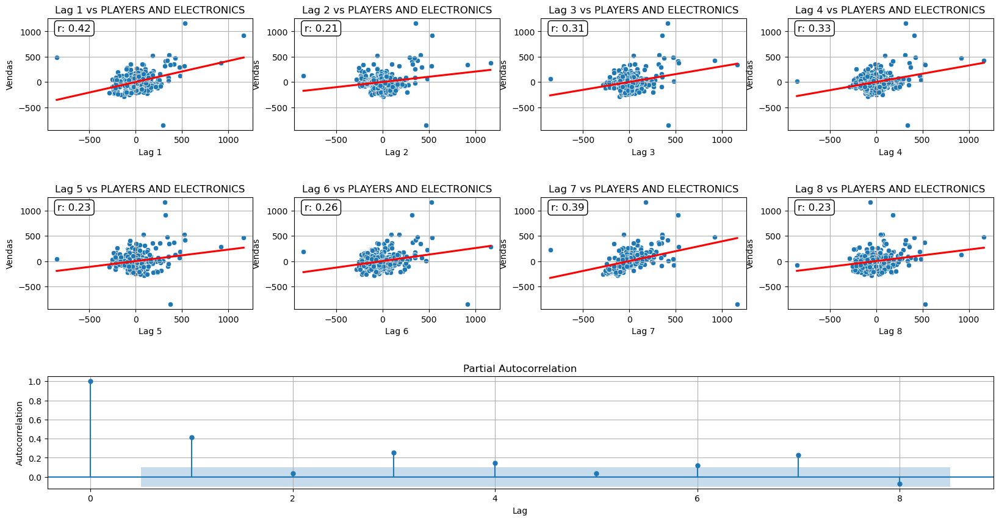

3


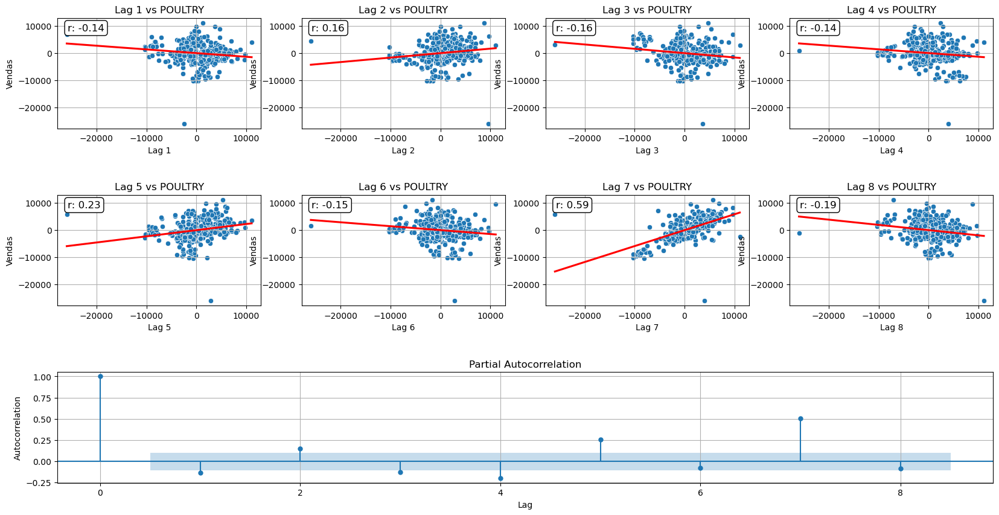

3


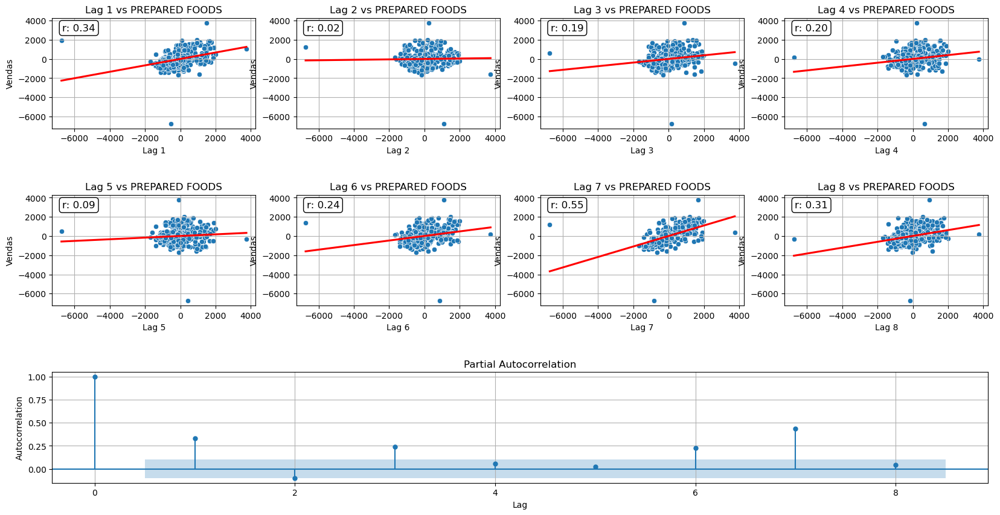

3


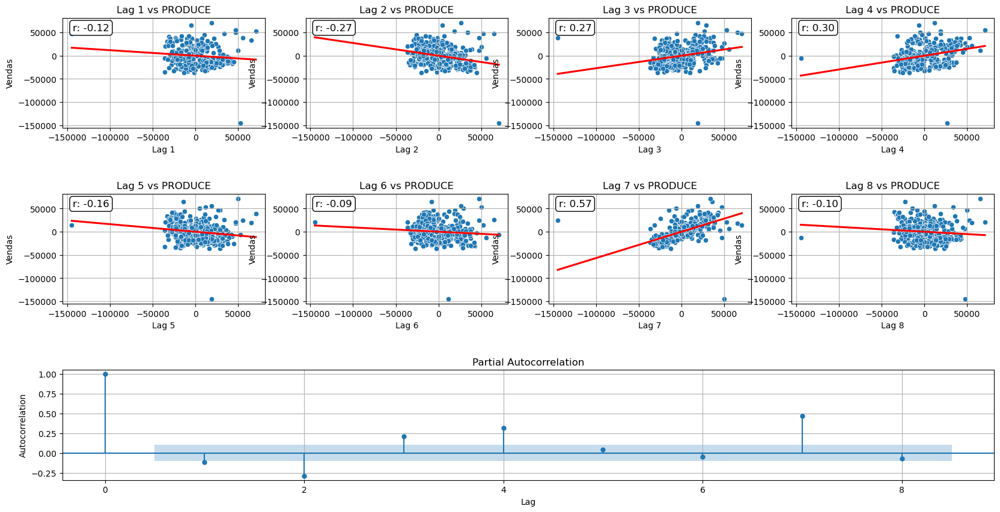

3


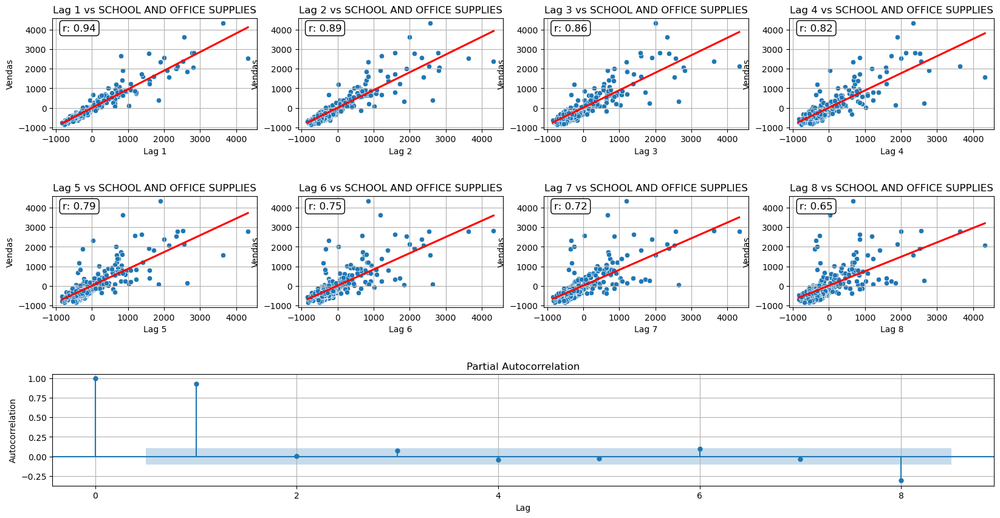

3


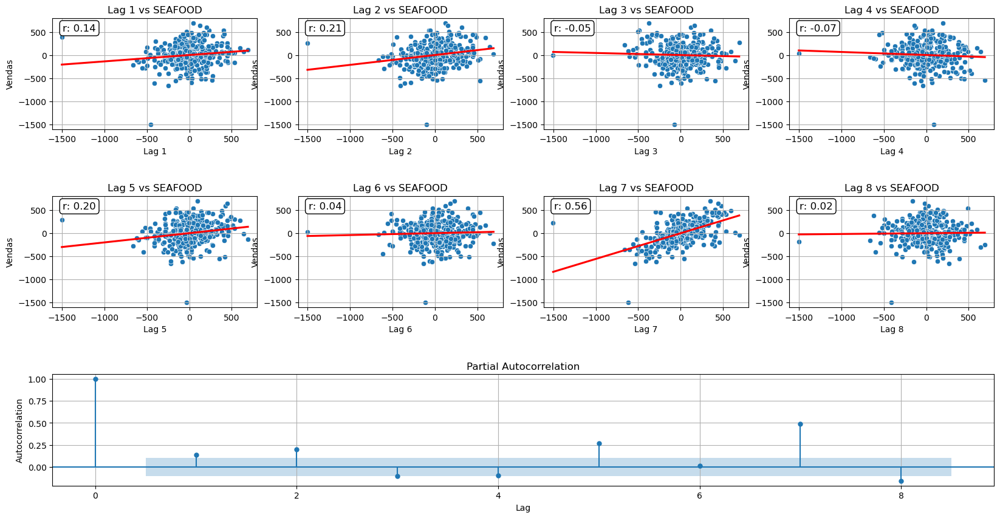

In [9]:
eda.all_families_lag(freq='M', order=4, max_lag=8)

## Pré-processamento

In [4]:
class Preprocessor():
    def __init__(self):
        # self.oil = pd.read_csv('oil.csv')
        # self.stores = pd.read_csv('stores.csv')
        # self.transactions = pd.read_csv('transactions.csv')

        self.train = None
        self.holiday_train = None
        self.test = None
        self.holiday_test = None
        self.dataset = None
        

    def import_train(self):
        self.train = pd.read_csv(
            'train.csv',
            usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
            dtype={
                'store_nbr': 'category',
                'family': 'category',
                'sales': 'float32',
                'onpromotion': 'uint32',
            },
            parse_dates=['date'],
        )
        self.train['date'] = self.train.date.dt.to_period('D')
        self.train['item'] = "S" + self.train['store_nbr'].astype(str) + "_" + self.train['family'].astype(str)
        self.dataset = self.train.pivot(index='date', columns='item', values='sales')
        self.train=self.train.set_index(['date']).sort_index()

    def import_test(self):
        self.test = pd.read_csv(
            'test.csv',
            usecols=['store_nbr', 'family', 'date', 'onpromotion'],
            dtype={
                'store_nbr': 'category',
                'family': 'category',
                'onpromotion': 'uint32',
            },
            parse_dates=['date'],
        )
        self.test['date'] = self.test.date.dt.to_period('D')
        self.test['item'] = "S" + self.test['store_nbr'].astype(str) + "_" + self.test['family'].astype(str)
        self.test=self.test.set_index(['date']).sort_index()
    
    def import_holidays(self):
        holidays_events = pd.read_csv(
            "holidays_events.csv",
            dtype={
                'type': 'category',
                'locale': 'category',
                'locale_name': 'category',
                'description': 'category',
                'transferred': 'bool',
            },
            parse_dates=['date'],
        )       
        holidays_events = holidays_events.set_index('date').to_period('D')
        holidays = (
            holidays_events
            .query("locale in ['National', 'Regional']")
            .loc['2016':'2017-08-16', ['description']]
            .assign(description=lambda x: x.description.cat.remove_unused_categories())
        )
        holidays = pd.get_dummies(holidays, dtype=float)
        self.holidays_train, self.holidays_test = holidays[:"2017-08-01"], holidays["2017-08-01":"2017-08-15"]

    def fill_christmas(self):
        missing_dates = ['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25']
        date_objects = pd.to_datetime(missing_dates, format='%Y-%m-%d')
        missing_df = pd.DataFrame({'date': date_objects})
        missing_df['date'] = missing_df.date.dt.to_period('D')
        missing_df = missing_df.set_index(['date']).sort_index()
        self.dataset = pd.concat([self.dataset, missing_df])
        self.dataset.fillna(0, inplace=True)
        self.dataset.sort_index(inplace=True)
        self.dataset = self.dataset.rename_axis("item", axis="columns")

    def find_zeros(self):
        zero_sales = list(self.dataset.loc[:, (self.dataset == 0).all()].columns)
        self.train['available'] = np.where(self.train['item'].isin(zero_sales), 0, 1)
        self.test['available'] = np.where(self.test['item'].isin(zero_sales), 0, 1)


    def generate_dataset(self):
        self.import_train()
        self.import_test()
        self.import_holidays()
        self.fill_christmas()
        self.find_zeros()

    def fourier(self, y):
        fourier = CalendarFourier(freq='M', order=4)
        dp = DeterministicProcess(
            index=y.index,
            constant=True,
            order=1,
            seasonal=True,
            additional_terms=[fourier],
            drop=True,
        )
        return dp

    def generate_training_data(self, START, END):
        y = self.dataset.loc[START:END]
        # X_1: Features for Linear Regression
        dp = self.fourier(y)
        X_1 = dp.in_sample()
        X_1['NewYear'] = (X_1.index.dayofyear == 1)
        # X_2: Features for XGBoost
        X_2 = self.train.drop(['sales', 'store_nbr', 'item'], axis=1).loc[START:END]  # sobra apenas onpromotion
        le = LabelEncoder()
        le.fit(X_2.family)
        X_2['family'] = le.transform(X_2['family'])
        X_2["day"] = X_2.index.day 
        X_2 = X_2.join(self.holidays_train, on='date').fillna(0.0)
        y_train, y_valid = y[:"2017-07-01"], y["2017-07-02":]
        X1_train, X1_valid = X_1[: "2017-07-01"], X_1["2017-07-02" :]
        X2_train, X2_valid = X_2.loc[:"2017-07-01"], X_2.loc["2017-07-02":]
        return  y, y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid
    
    def generate_test_data(self, START, END):
        y = self.dataset.loc[START:END]
        # X_1: Features for Linear Regression
        dp = self.fourier(y)
        X_1 = dp.out_of_sample(steps=16)
        X_1['NewYear'] = (X_1.index.dayofyear == 1)
        # X_2: Features for XGBoost
        X_2 = self.test.drop(['store_nbr', 'item'], axis=1).loc[START:END]  # sobra apenas onpromotion
        le = LabelEncoder()
        le.fit(X_2.family)
        X_2['family'] = le.transform(X_2['family'])
        X_2["day"] = X_2.index.day 
        X_2 = X_2.join(self.holidays_test, on='date').fillna(0.0)
        return  X_1, X_2
    

## Modelo

In [7]:
class BoostedHybrid:
    def __init__(self, model_1=Ridge(), model_2=XGBRegressor()):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None
        self.y_fit = None
        self.y_resid = None

    def fit(self, X_1, X_2, y):
        self.model_1.fit(X_1, y)
        y_fit = pd.DataFrame(
            self.model_1.predict(X_1), 
            index=X_1.index, columns=y.columns,
        )
        y_resid = y - y_fit
        y_resid = y_resid.stack().squeeze()
        self.model_2.fit(X_2, y_resid)
        self.y_columns = y.columns
        self.y_fit = y_fit
        self.y_resid = y_resid

    def predict(self, X_1, X_2):
        y_pred = pd.DataFrame(
            self.model_1.predict(X_1),
            index=X_1.index, columns=self.y_columns,
        )
        y_pred = y_pred.stack().squeeze()
        y_pred += self.model_2.predict(X_2)
        return y_pred.unstack()
    
    def validation_results(self, y, y_train, y_valid, y_fit, y_pred):
        y_fit = y_fit.clip(0.0)
        y_pred = y_pred.clip(0.0)
        families = y.columns[0:6]
        axs = y.loc(axis=1)[families].plot(
            subplots=True, figsize=(11, 9), marker='.', linestyle='-',
            color='0.25', label='vendas', linewidth=1, markersize=4, alpha=0.5)
        _ = y_fit.loc(axis=1)[families].plot(subplots=True, color='C0', ax=axs)
        _ = y_pred.loc(axis=1)[families].plot(subplots=True, color='C3', ax=axs)
        for ax, family in zip(axs, families):
            ax.legend([])
            ax.set_ylabel(family)
        error_train = mean_squared_log_error(y_train, y_fit)
        error_valid = mean_squared_log_error(y_valid, y_pred)
        print(f"erro de treinamento: {error_train}")
        print(f"erro de validação: {error_valid}")
        plt.show()
        
    def generate_csv(self, y_test):
        y_test = y_test.reset_index(drop=False)
        y_test = y_test.rename(columns={'index': 'date'})
        y_test['date'] = y_test['date'].astype(str)
        unpivoted = (y_test
                        .melt(id_vars='date', var_name='item', value_name='sales')
                        )
        unpivoted[['store_nbr', 'family']] = unpivoted['item'].str.extract(r'S(\d+)_(.+)')
        unpivoted = (unpivoted
            .dropna()
            .drop(['item'], axis=1)
        )
        output = pd.read_csv(
                    'test.csv',
                    usecols=['id','store_nbr', 'family', 'date', 'onpromotion'],
                    dtype={
                        'store_nbr': 'category',
                        'family': 'category',
                        'onpromotion': 'uint32',
                    },
                    parse_dates=['date'],
                )
        output['date'] = output['date'].astype(str)
        output = output.merge(unpivoted, on=['date', 'store_nbr', 'family'], how='left', suffixes=('', '_unpivoted'))
        output = output.drop(['date', 'store_nbr', 'family','onpromotion'], axis=1)
        output.to_csv('submission.csv',index=False)

erro de treinamento: 0.5417066393933063
erro de validação: 0.51529142332049


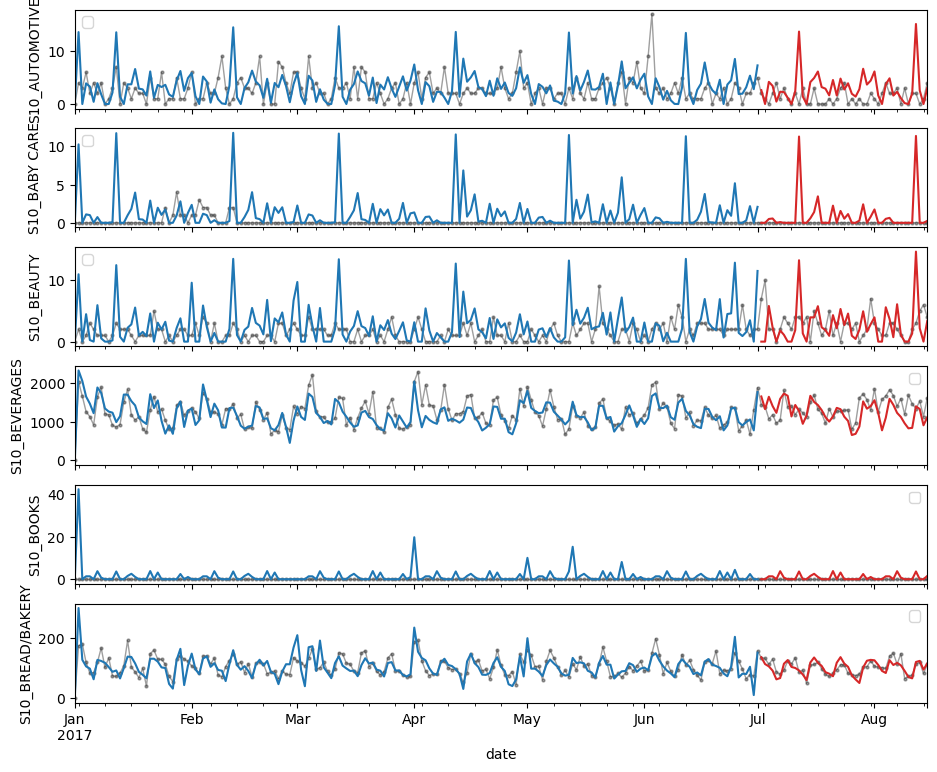

In [8]:
preprocessor = Preprocessor()
preprocessor.generate_dataset()
y, y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid = preprocessor.generate_training_data('2017','2017')

model = BoostedHybrid()
model.fit(X1_train, X2_train, y_train)
y_fit = model.predict(X1_train, X2_train)
y_pred = model.predict(X1_valid, X2_valid)
model.validation_results(y, y_train, y_valid, y_fit, y_pred)

## Previsão do dataset de teste

In [10]:
# unindo o dataset de treino e de validação em um só
X1 = pd.concat([X1_train, X1_valid], axis=0)
X2 = pd.concat([X2_train, X2_valid], axis=0)
y = pd.concat([y_train, y_valid], axis=0)
# retreinando com todos os dados de treino
model = BoostedHybrid()
model.fit(X1, X2, y)
# fazendo a previsão para o dataset de teste
X1_test, X2_test = preprocessor.generate_test_data('2017','2017')
y_test = model.predict(X1_test, X2_test)
model.generate_csv(y_test)

(28512, 64)


In [11]:
print(X2_train.shape)

(324324, 64)
